In [1]:
from process import *
from visualize import *
from glycowork.motif.annotate import *
from glycowork.motif.graph import *
import os
import warnings
warnings.filterwarnings("ignore")

# Case studies and applications of GlyContact

## 1 - Glycans with one major structural cluster
Each glycan structure is described on GlycoShape by multiple PDB files, corresponding to multiple structural clusters. Structures were obtained using Molecular Dynamic simulations (MD) and classified based on similarity within these conformational clusters.

Using GlyContact, we can search for major glycan structures, meaning glycans with one favored conformation.

In [2]:
### The following function returns glycans with one preferred conformation according to a frequency threshold
### Here, having a preferred conformation means having a cluster observed with a frequency >= 70%
res = glycan_cluster_pattern(threshold = 70)

### Glycans with a major cluster are saved in the first list returned by glycan_cluster_pattern
print(res[0])

Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
['Man3Me(a1-3)[Man3Me(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc', 'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc', 'IdoA2S(a1-4)GlcNS6S', 'Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Glc', 'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)][Fuc(a1-3)]GlcNAc', 'Gal(b1-4)Glc', 'GlcNAc(b1-2)Man(a1-3)[GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)GlcNAc', 'Fuc', 'Fuc(a1-3)[Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)]GlcNAc(b1-4)Glc', 'Man', 'GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc', 'Man(a1-3)[Xyl(b1-2)][Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc', 'GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA', 'GalNAc(b1-3)GlcNAc(b1-4)Man', 'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Ma

Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
Number of glycans with one major cluster: 9
Number of glycans without a major cluster: 439
Number of glycans with one major cluster: 14
Number of glycans without a major cluster: 434
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 33
Number of glycans without a major cluster: 415
Number of glycans with one major cluster: 55
Number of glycans without a major cluster: 393
Number of glycans with one major cluster: 72
Number of glycans without a major cluster: 376
Number of glycans with one major cluster: 104
Number of glycans without a major clust

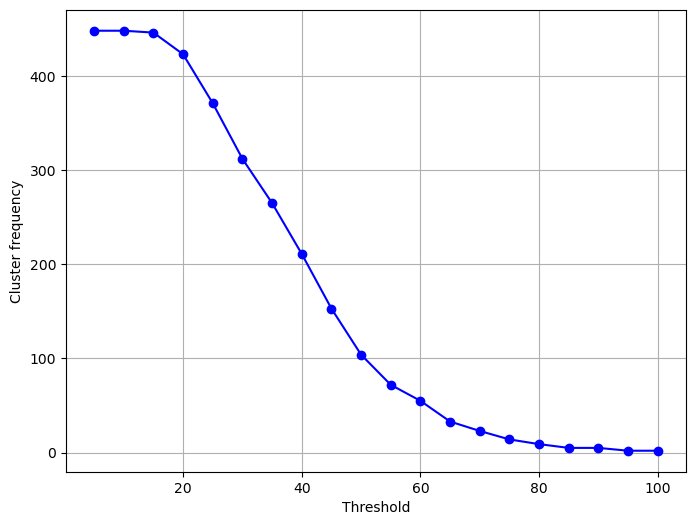

In [6]:
### Let see distribution of cluster frequencies for different thresholds

x = []
freq = []
for threshold in range(100,0,-5):
    x.append(threshold)
    freq.append(len(glycan_cluster_pattern(threshold)[0]))

plt.figure(figsize=(8, 6))
plt.plot(x, freq, marker='o', linestyle='-', color='b')  # Line plot with markers
plt.xlabel('Threshold')
plt.ylabel('Cluster frequency')
plt.grid(True)
plt.show()


In [4]:
### Lets investigate which glycans have a major cluster with different thresholds
for threshold in range(100,50,-10):
    print("\nThreshold: " + str(threshold))
    for g in glycan_cluster_pattern(threshold)[0] :
        print(g)



Threshold: 100
Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
Fuc
Man

Threshold: 90
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
Fuc
Fuc(a1-3)[Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)]GlcNAc(b1-4)Glc
Man
GalNAc(b1-3)GlcNAc(b1-4)Man
Fuc(a1-3)[Neu5Ac(a2-3)Gal(b1-4)]GlcNAc(b1-3)Gal

Threshold: 80
Number of glycans with one major cluster: 9
Number of glycans without a major cluster: 439
Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Glc
Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)][Fuc(a1-3)]GlcNAc
Fuc
Fuc(a1-3)[Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)]GlcNAc(b1-4)Glc
Man
GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA
GalNAc(b1-3)GlcNAc(b1-4)Man
Fuc(a1-3)[Gal(b1-4)]GlcNAc(b1-2)[GlcNAc(b1-4)]Man(a1-3)[GlcNAc(b1-2)[GlcNAc(b1-6)]Man(a1-6)][GlcNAc(b1-4)

In [7]:
### is it related to a specific silhouette?
for threshold in range(100,50,-10):
    print("\nThreshold: " + str(threshold))
    for g in glycan_cluster_pattern(threshold)[0] :
        print(convert_glycan_to_X(g))

### Doesn't seem so



Threshold: 100
Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
X
X

Threshold: 90
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
X
X[X[XX]XX]XX
X
XXX
X[XX]XX

Threshold: 80
Number of glycans with one major cluster: 9
Number of glycans without a major cluster: 439
X[XX]XXXX
XXX[XXX][X]XX[X][X]X
X
X[X[XX]XX]XX
X
XXXXXXXXXX
XXX
X[X]X[X]X[X[X]X][X]XXX
X[XX]XX

Threshold: 70
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
X[X]XXX
XXX[XXX]XXX
XX
X[XX]XXXX
XXX[XXX][X]XX[X][X]X
XX
XX[XX][X]XXX
X
X[X[XX]XX]XX
X
XXXX
X[X][X]XX[X]X
XXXXXXXXXX
XXX
XXXX[XXXX]XXX
X[X]X
X[X]X[X]X[X[X]X][X]XXX
X[XX]XX
XXXXX
XXX
XX[XX]X[XXXX]XX[X]X
XXX[XXX][X]XX[X]X
XXXXXXXXXXXXXXXXXXXX

Threshold: 60
Number of glycans with one major cluster: 55
Number of glycans without a major cluster: 393
X[X]XXX
XXX[XXX]XXX
XXXXX[XX[XX]X]XXX
XXX[X[X]XX]XX[X]X
XXXXXXXXXXX
XXXXX
XX
X[XX]XXXX
XXX[XX[XX]X]

In [6]:
### Is it related to the presence of a given monosaccharide?
df = pd.DataFrame()
list_monothresh = []
list_major_prop = []
list_minor_prop = []
for mono in ['Fuc', 'Man', 'GlcNAc', 'GalNAc', 'Neu5Ac', 'Neu5Gc', 'Glc', 'Gal', 'Xyl', "GlcA", "Rha", "IdoA", "GlcNS"] : 
    for threshold in range(100,0,-10):
        mono_threshold = mono + '_' + str(threshold)
        list_monothresh.append(mono_threshold)

        res = glycan_cluster_pattern(threshold)
        total_with_major = len(res[0])
        total_without_major = len(res[1])
        mono_containing_major = 0
        mono_containing_others = 0
        for g in res[0] :
            if mono in g :
                mono_containing_major = mono_containing_major + 1
        for g in res[1] :
            if mono in g :
                mono_containing_others = mono_containing_others + 1
        try :
            percent_major_containing_mono = mono_containing_major/total_with_major*100
        except :
            percent_major_containing_mono = 0

        try :
            percent_others_containing_mono = mono_containing_others/total_without_major*100
        except : 
            percent_others_containing_mono = 0

        list_major_prop.append(percent_major_containing_mono)
        list_minor_prop.append(percent_others_containing_mono)

df['Monosaccharide_threshold'] = list_monothresh
df['Proportion_in_major'] = list_major_prop
df['Proportion_in_others'] = list_minor_prop

df

Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
Number of glycans with one major cluster: 9
Number of glycans without a major cluster: 439
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 55
Number of glycans without a major cluster: 393
Number of glycans with one major cluster: 104
Number of glycans without a major cluster: 344
Number of glycans with one major cluster: 211
Number of glycans without a major cluster: 237
Number of glycans with one major cluster: 312
Number of glycans without a major cluster: 136
Number of glycans with one major cluster: 423
Number of glycans without a major cluster: 25
Number of glycans with one major cluster: 448
Number of glycans without a major cluster: 0
Number of glycans with one major cluster: 2
Number of glycans without a major clu

KeyboardInterrupt: 

In [ ]:
df

,Monosaccharide_threshold,Proportion_in_major,Proportion_in_others
0,Fuc_100,50.000000,45.964126
1,Fuc_90,60.000000,45.823928
2,Fuc_80,66.666667,45.558087
3,Fuc_70,47.826087,45.882353
4,Fuc_60,40.000000,46.819338
...,...,...,...
125,GlcNS_50,2.884615,3.488372
126,GlcNS_40,2.843602,3.797468
127,GlcNS_30,2.884615,4.411765
128,GlcNS_20,3.309693,4.000000


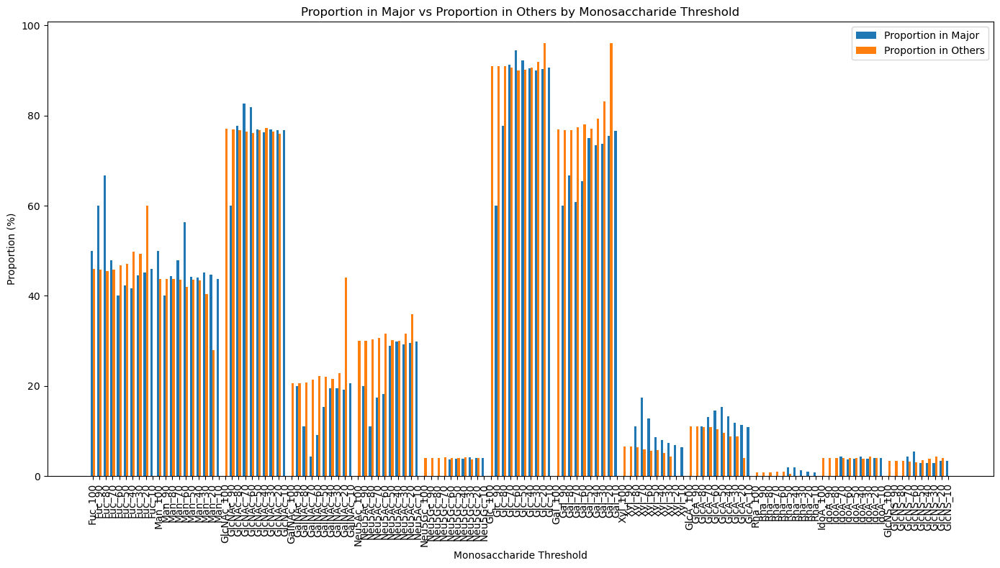

In [ ]:
bar_width = 0.35
index = np.arange(len(df['Monosaccharide_threshold']))

# Plotting the bars
plt.figure(figsize=(14, 8))
bar1 = plt.bar(index, df['Proportion_in_major'], bar_width, label='Proportion in Major')
bar2 = plt.bar(index + bar_width, df['Proportion_in_others'], bar_width, label='Proportion in Others')

# Adding labels, title, and custom X-axis tick labels
plt.xlabel('Monosaccharide Threshold')
plt.ylabel('Proportion (%)')
plt.title('Proportion in Major vs Proportion in Others by Monosaccharide Threshold')
plt.xticks(index + bar_width / 2, df['Monosaccharide_threshold'], rotation=90)

# Adding the legend
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
### Fixing only two groups: glycans with a cluster >=70 vs < 70
df = pd.DataFrame()
list_monothresh = []
list_major_prop = []
list_minor_prop = []
for mono in ['Fuc', 'Man', 'GlcNAc', 'GalNAc', 'Neu5Ac', 'Neu5Gc', 'Glc', 'Gal', 'Xyl', "GlcA", "Rha", "IdoA", "GlcNS", "a1-2", "a1-3", "a2-3", "a2-6", "a1-6", "b1-2", "b1-3", "b1-4", "3S", "6S", "Me"] : 
    for threshold in [70]:
        mono_threshold = mono + '_' + str(threshold)
        list_monothresh.append(mono_threshold)

        res = glycan_cluster_pattern(threshold)
        total_with_major = len(res[0])
        total_without_major = len(res[1])
        mono_containing_major = 0
        mono_containing_others = 0
        for g in res[0] :
            if mono in g :
                mono_containing_major = mono_containing_major + 1
        for g in res[1] :
            if mono in g :
                mono_containing_others = mono_containing_others + 1
        try :
            percent_major_containing_mono = mono_containing_major/total_with_major*100
        except :
            percent_major_containing_mono = 0

        try :
            percent_others_containing_mono = mono_containing_others/total_without_major*100
        except : 
            percent_others_containing_mono = 0

        list_major_prop.append(percent_major_containing_mono)
        list_minor_prop.append(percent_others_containing_mono)

df['Monosaccharide_threshold'] = list_monothresh
df['Proportion_in_major'] = list_major_prop
df['Proportion_in_others'] = list_minor_prop

Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major c

In [ ]:
df

,Monosaccharide_threshold,Proportion_in_major,Proportion_in_others
0,Fuc_70,47.826087,45.882353
1,Man_70,47.826087,43.529412
2,GlcNAc_70,82.608696,76.470588
3,GalNAc_70,4.347826,21.411765
4,Neu5Ac_70,17.391304,30.588235
5,Neu5Gc_70,0.000000,4.235294
6,Glc_70,91.304348,90.588235
7,Gal_70,60.869565,77.411765
8,Xyl_70,17.391304,5.882353
9,GlcA_70,13.043478,10.823529


In [ ]:
### what about repeating the analysis by silhouette_clusters?

## 2 - Monosaccharide SASA and flexibility between glycan classes (N-/O- glycans)

In [2]:
glycoshape_glycans = get_glycoshape_IUPAC()
nglycans = []
other_glycans = []
for g in glycoshape_glycans :
    if 'Man(b1-4)GlcNAc(b1-4)' in g :
        nglycans.append(g)
    else :
        other_glycans.append(g)
print(len(nglycans))
print(len(other_glycans))

181
376


Flexibility

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

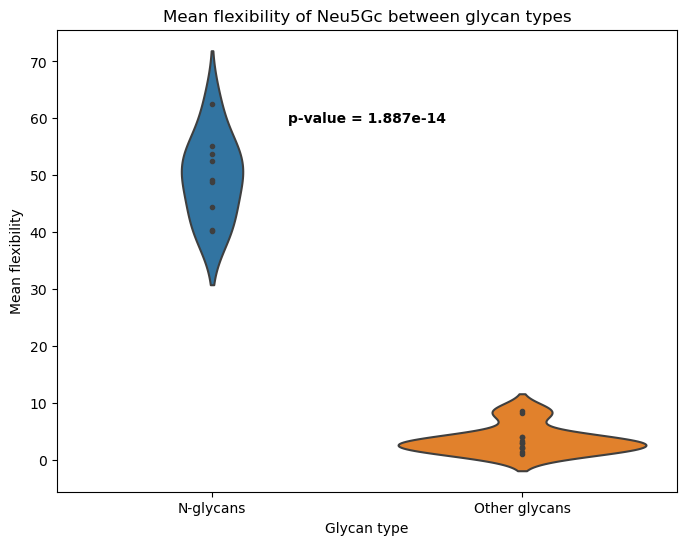

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('b1-4', 'Man')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages

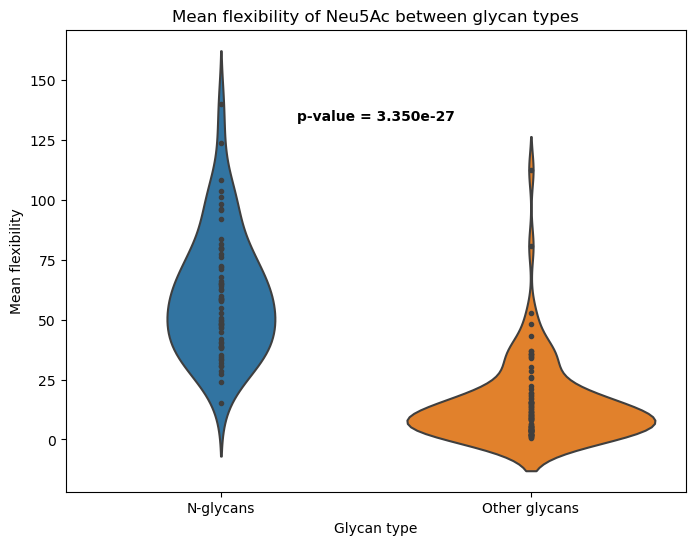

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
Filtered Differences: [('Fuc', 'a1-3'), ('a1-3', 'GlcNAc')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('Xyl', 'b1-2')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a s

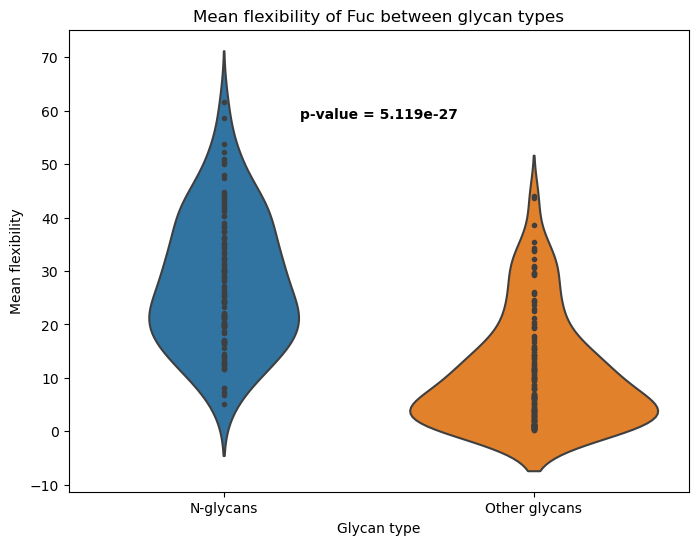

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

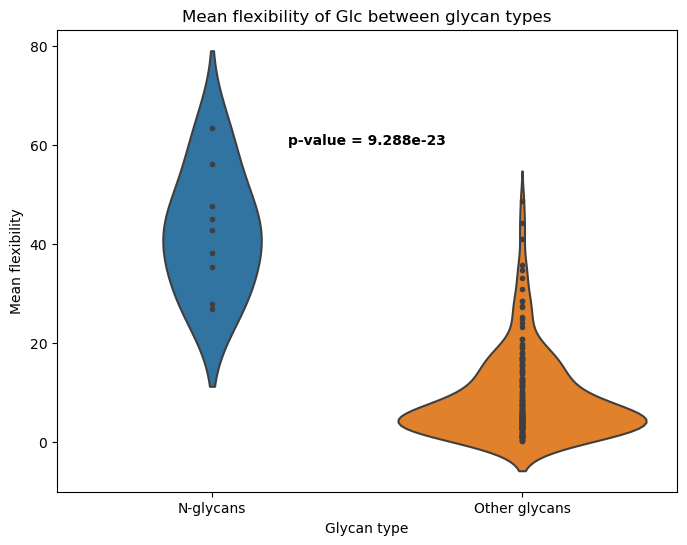

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('b1-4', 'Man')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages

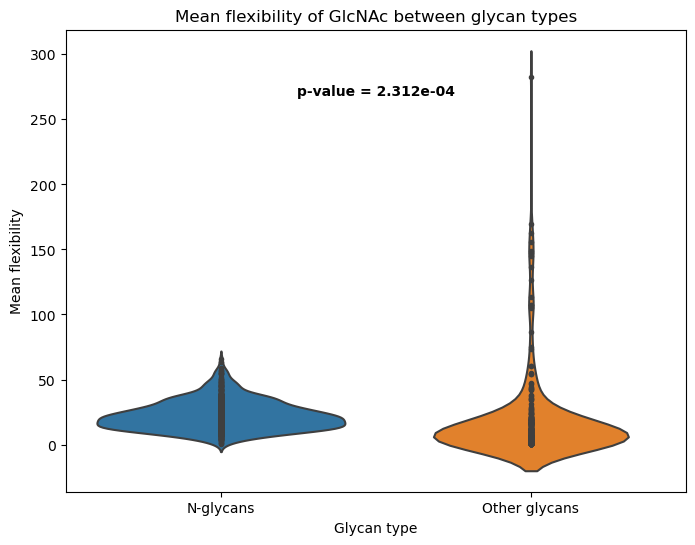

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('b1-4', 'Man')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages

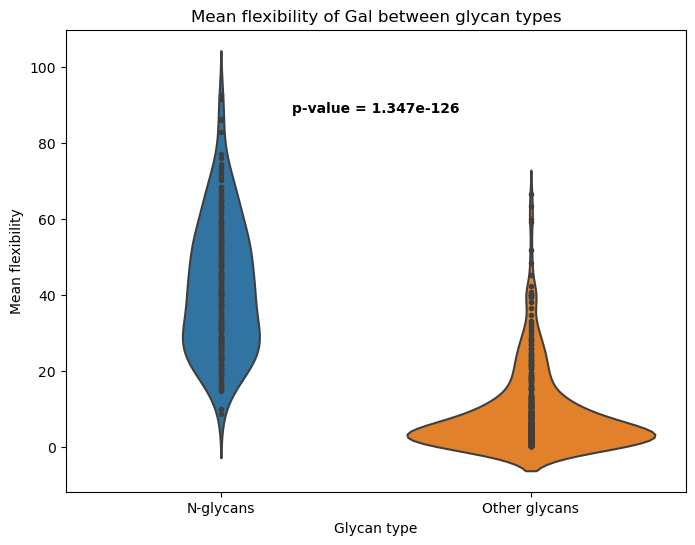

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

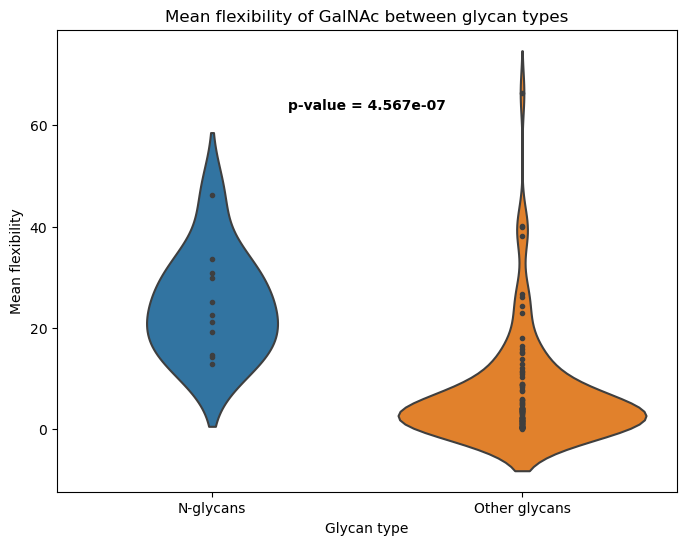

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('b1-4', 'Man')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages

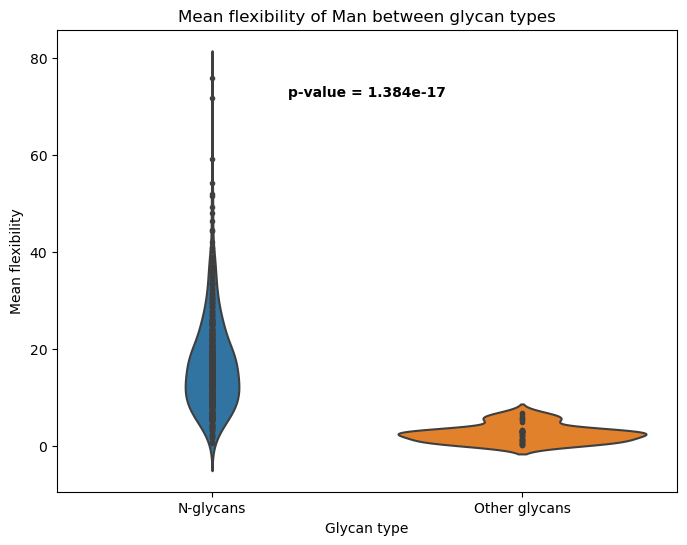

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

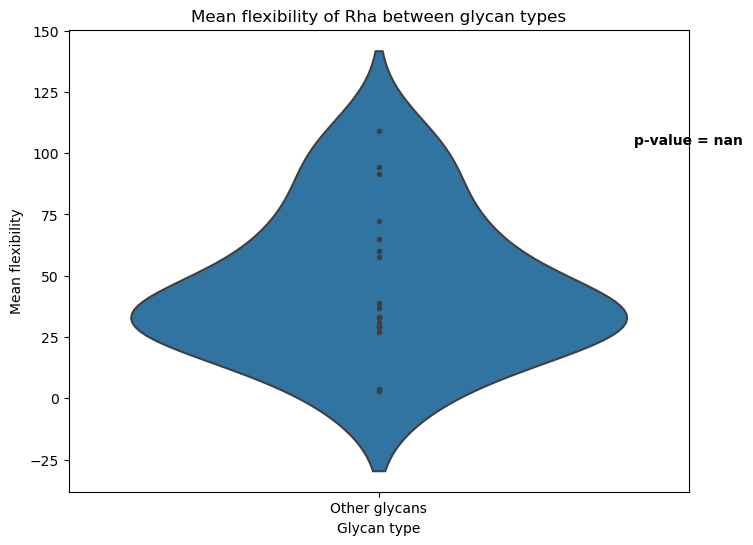

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
Filtered Differences: [('Fuc', 'a1-3'), ('a1-3', 'GlcNAc')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('Xyl', 'b1-2')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a s

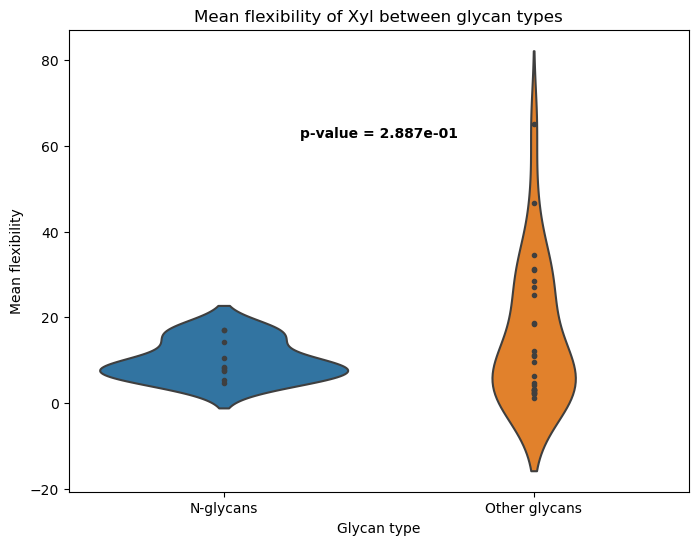

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

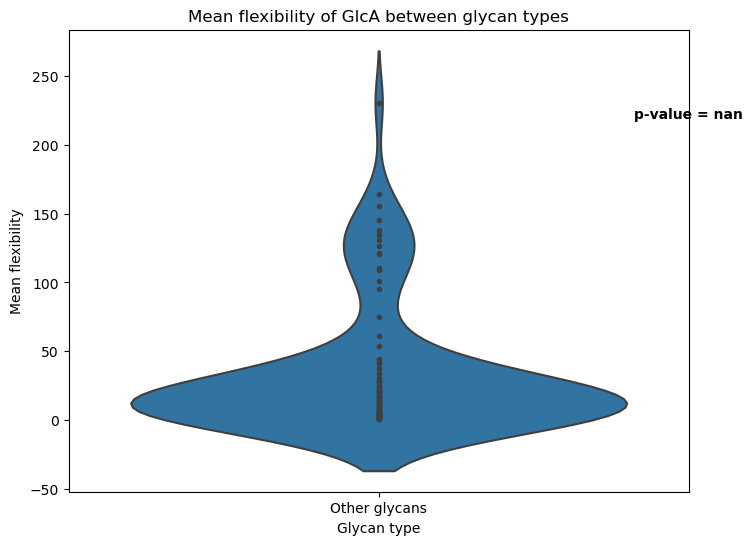

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

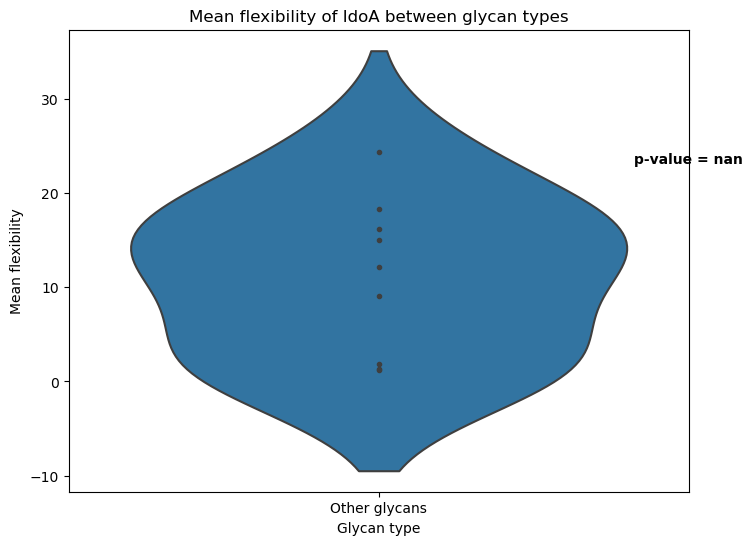

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

ValueError: min() arg is an empty sequence

<Figure size 800x600 with 0 Axes>

In [ ]:
from glycowork.motif.annotate import *
from scipy.stats import ttest_ind
'''
# N-glycans
mono_list = ['Neu5Gc', 'Neu5Ac', 'Fuc', 'Glc', 'GlcNAc', 'Gal', 'GalNAc', 'Man', 'Rha', 'Xyl', 'GlcA', 'IdoA']
for mono in mono_list :
    mono_mean_flex_across_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in nglycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        print(compo)
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted')
                res = overall_monosaccharide_flexibility(isvt, mode='mean')
                val_list = [res[key] for key in res if mono in key]
                for v in val_list:
                    mono_mean_flex_across_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    #Others
    mono_mean_flex_across_other_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in other_glycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted')
                res = overall_monosaccharide_flexibility(isvt, mode='mean')
                val_list = [res[key] for key in res if mono in key]
                for v in val_list:
                    mono_mean_flex_across_other_glycans.append(v)
            except: 
                print("This glycan failed: " + g)


    data = pd.DataFrame({
        'Mean flexibility': mono_mean_flex_across_glycans + mono_mean_flex_across_other_glycans,
        'Glycan type': ['N-glycans'] * len(mono_mean_flex_across_glycans) + ['Other glycans'] * len(mono_mean_flex_across_other_glycans)
    })

    # Compute the p-value
    t_stat, p_value = ttest_ind(mono_mean_flex_across_glycans, mono_mean_flex_across_other_glycans)

    # Display the p-value on the plot
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='Glycan type', y='Mean flexibility', data=data, inner="point")
    plt.text(0.5, max(mono_mean_flex_across_glycans + mono_mean_flex_across_other_glycans) * 0.95, f'p-value = {p_value:.3e}',
            horizontalalignment='center', size='medium', color='black', weight='semibold')


    # Save the plot to a file
    plt.savefig(mono + '_mean_flexibility_between_glycans.png', dpi=300)

    # Create the violin plot

    plt.title('Mean flexibility of ' + mono + ' between glycan types')
    plt.show()
'''


This glycan failed: Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)[Gal(b1-4)GlcNAc(b1-2)]Man(a1-3)[Gal(b1-4)GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-6)[Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)[Neu5Ac(

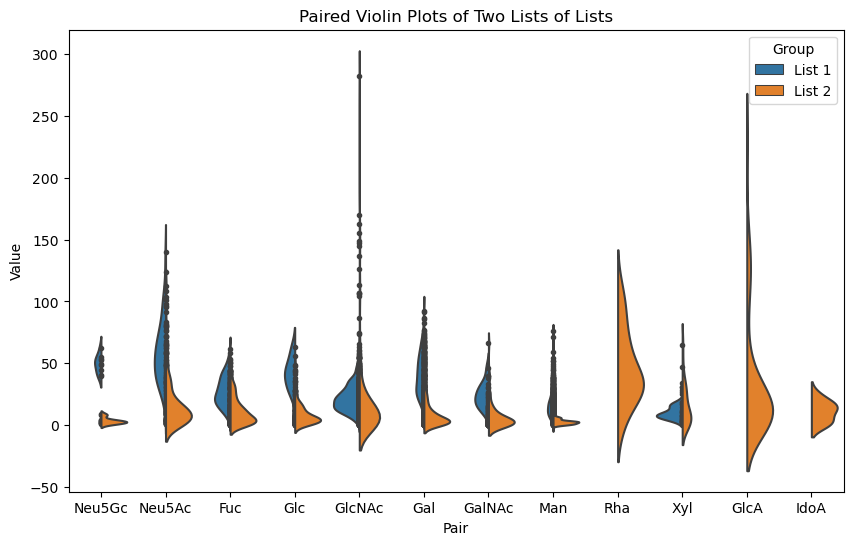

In [24]:
# N-glycans
mono_list = ['Neu5Gc', 'Neu5Ac', 'Fuc', 'Glc', 'GlcNAc', 'Gal', 'GalNAc', 'Man', 'Rha', 'Xyl', 'GlcA', 'IdoA']
nglycan_means = []
other_means = []

for mono in mono_list :
    mono_mean_flex_across_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in nglycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted')
                res = overall_monosaccharide_flexibility(isvt, mode='mean')
                val_list = [res[key] for key in res if mono in key]
                for v in val_list:
                    mono_mean_flex_across_glycans.append(v)
            except: 
                pass
                #print("This glycan failed: " + g)

    nglycan_means.append(mono_mean_flex_across_glycans)

    #Others
    mono_mean_flex_across_other_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in other_glycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted')
                res = overall_monosaccharide_flexibility(isvt, mode='mean')
                val_list = [res[key] for key in res if mono in key]
                for v in val_list:
                    mono_mean_flex_across_other_glycans.append(v)
            except: 
                pass
                #print("This glycan failed: " + g)

    other_means.append(mono_mean_flex_across_other_glycans)

data = []
for i, (sublist1, sublist2) in enumerate(zip(nglycan_means, other_means)):
    data.extend([(value, mono_list[i], 'List 1') for value in sublist1])
    data.extend([(value, mono_list[i], 'List 2') for value in sublist2])

# Convert to DataFrame
df = pd.DataFrame(data, columns=['Value', 'Pair', 'Group'])

# Create the paired violin plots
plt.figure(figsize=(10, 6))
sns.violinplot(x='Pair', y='Value', hue='Group', data=df, split=True, inner="point")

# Add a title
plt.title('Paired Violin Plots of Two Lists of Lists')

# Save the plot to a file
plt.savefig('paired_violinplots.png', dpi=300)

# Show the plot
plt.show()

In [23]:

df

,Value,Pair,Group
0,53.818723,Pair 1,List 1
1,55.064793,Pair 1,List 1
2,62.497666,Pair 1,List 1
3,40.148975,Pair 1,List 1
4,40.374790,Pair 1,List 1
...,...,...,...
18583,12.124132,IdoA,List 2
18584,18.319186,IdoA,List 2
18585,16.193336,IdoA,List 2
18586,24.431081,IdoA,List 2


Results: 
- Neu5Ac, Neu5Gc, Fuc and Man are largely more flexible in N-glycans than in other glycan types
- GalNAc is slightly more flexible in N-glycans 
- GlcNAc and Xyl are slightly more flexible in other glycan types


SASA

glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_2.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_3.

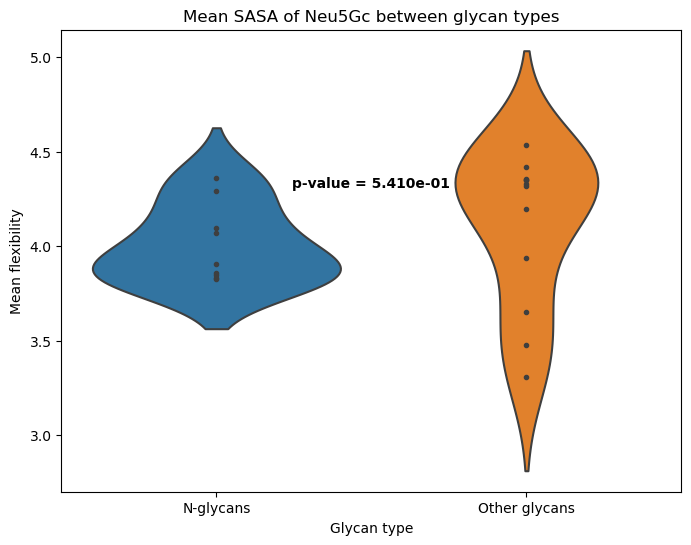

glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)G

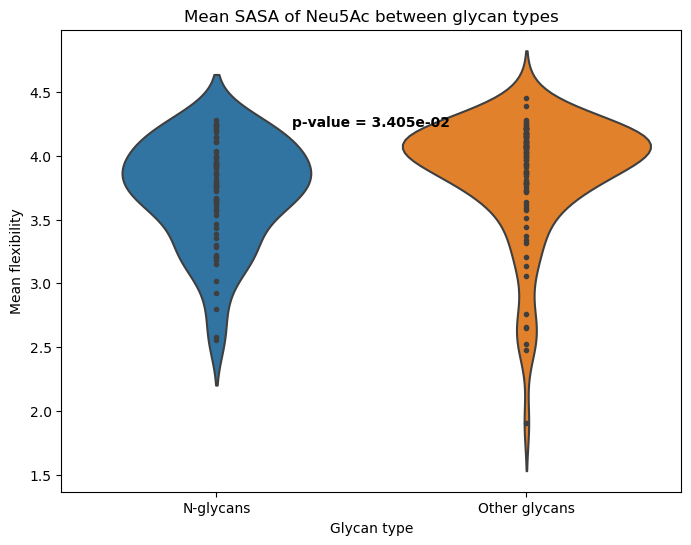

glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_0.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_1.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_2.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_3.pdb
glycans_pdb/

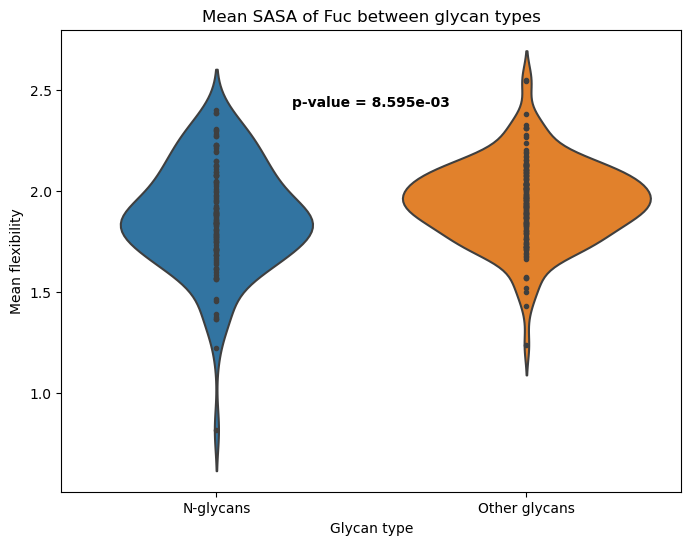

glycans_pdb/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_2.pdb
glycans_pdb/Glc(a1-2)Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Glc(a1-2)Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[M

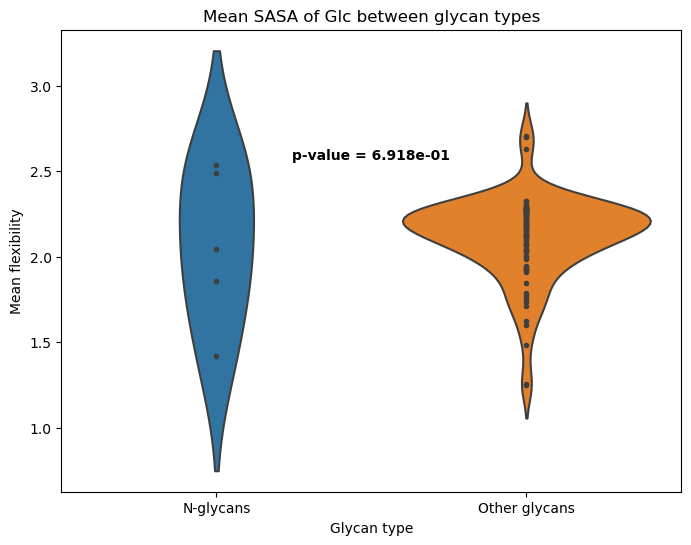

glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)G

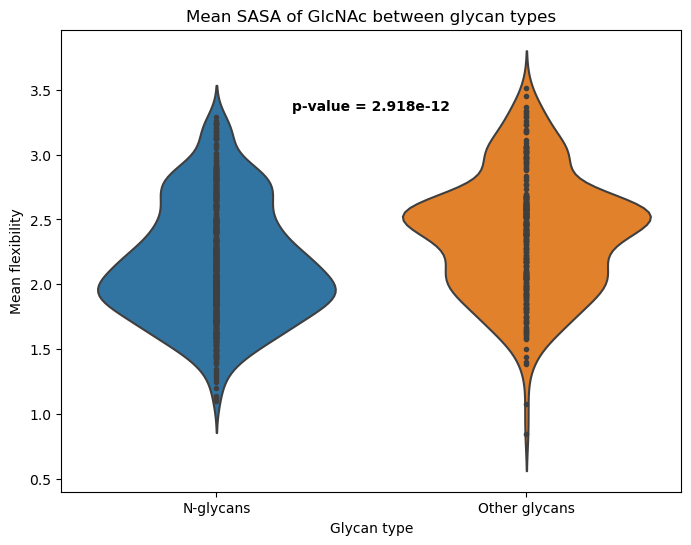

glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)G

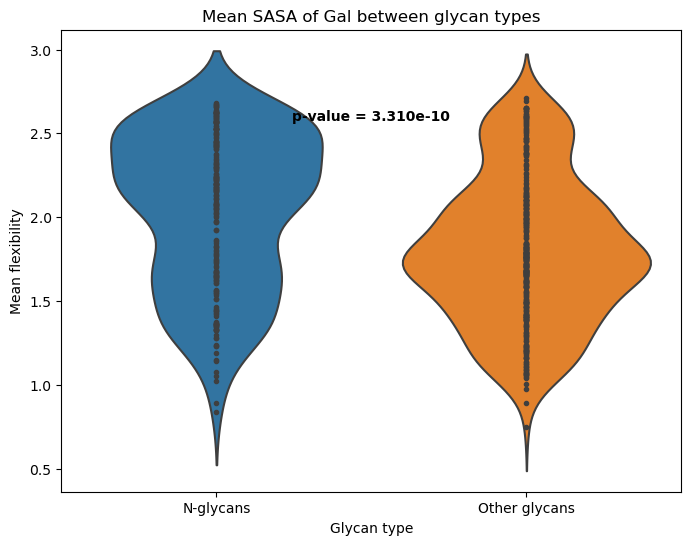

glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc_beta_0.pdb
glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc_beta_1.pdb
glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc_beta_2.pdb
glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc_beta_3.pdb
glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a

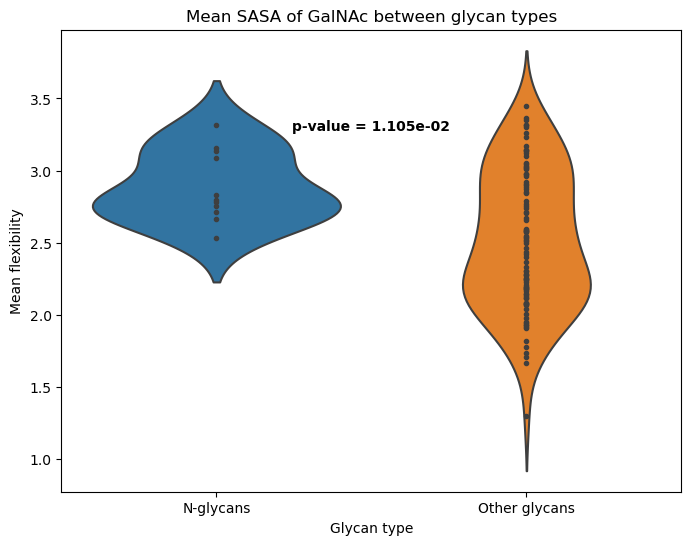

glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)G

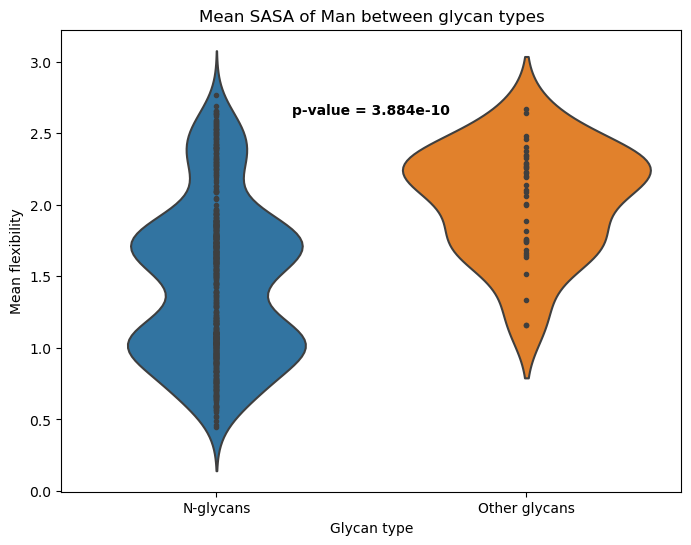

glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_0.pdb
glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_1.pdb
glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_2.pdb
glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_3.pdb
glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_4.pdb
glycans_pdb/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man_beta_0.pdb
glycans_pdb/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man_beta_1.pdb
glycans_pdb/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man_beta_2.pdb
glycans_pdb/Rha(a1-3)Rha(a

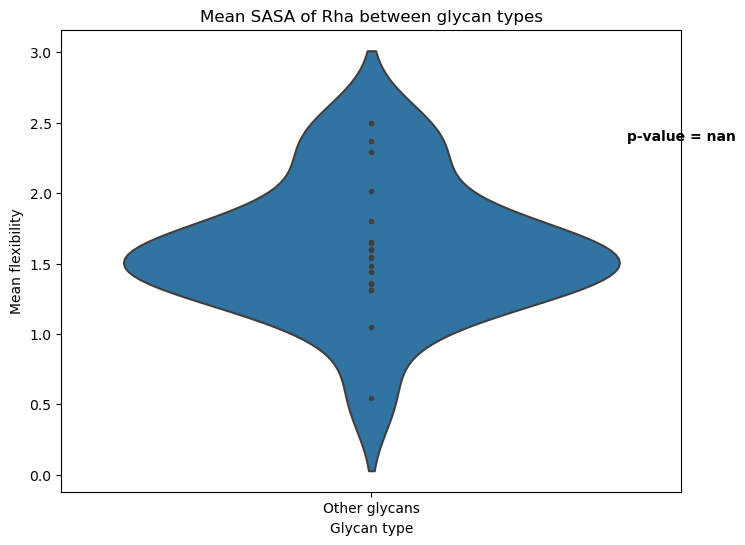

glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_0.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_1.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_2.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_3.pdb
glycans_pdb/

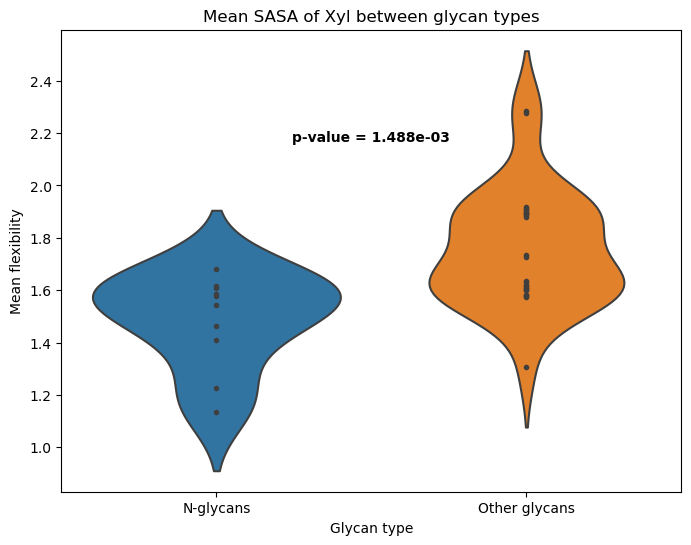

glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_0.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_1.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_2.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_3.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_4.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_5.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_0.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_1.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_2.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a

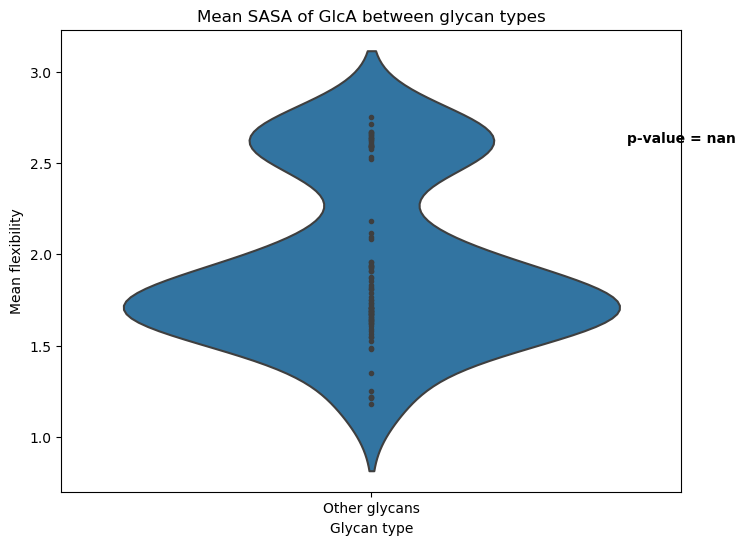

glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_0.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_1.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_2.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_3.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_4.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_0.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_1.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)

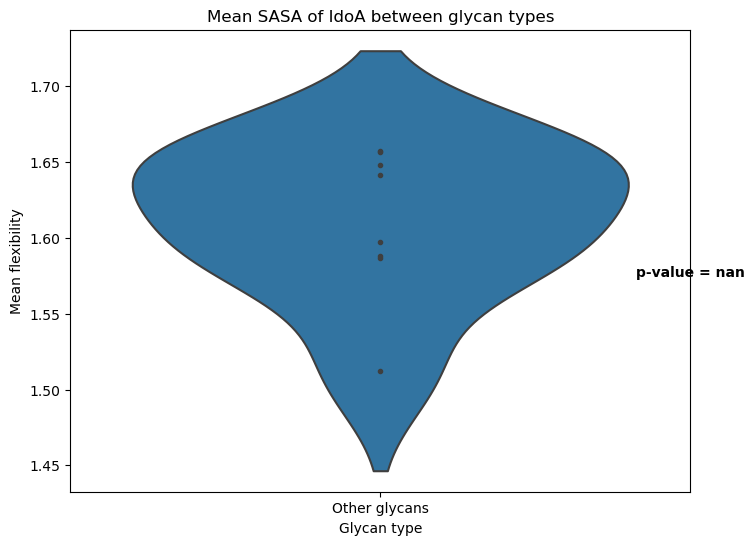

In [33]:
from glycowork.motif.annotate import *
from scipy.stats import ttest_ind

mono_list = ['Neu5Gc', 'Neu5Ac', 'Fuc', 'Glc', 'GlcNAc', 'Gal', 'GalNAc', 'Man', 'Rha', 'Xyl', 'GlcA', 'IdoA']
for mono in mono_list :
    mono_mean_flex_across_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in nglycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
                val_list = resdf['Weighted Score'][resdf['Monosaccharide'].str.contains(mono+'(', regex=False)==True].to_list()
                for v in val_list:
                    mono_mean_flex_across_glycans.append(v)
            except: 
                pass
                #print("This glycan failed: " + g)

    #Others
    mono_mean_flex_across_other_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in other_glycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
                val_list = resdf['Weighted Score'][resdf['Monosaccharide'].str.contains(mono+'(', regex=False)==True].to_list()
                for v in val_list:
                    mono_mean_flex_across_other_glycans.append(v)
            except: 
                pass
                #print("This glycan failed: " + g)


    data = pd.DataFrame({
        'Mean flexibility': mono_mean_flex_across_glycans + mono_mean_flex_across_other_glycans,
        'Glycan type': ['N-glycans'] * len(mono_mean_flex_across_glycans) + ['Other glycans'] * len(mono_mean_flex_across_other_glycans)
    })

    # Compute the p-value
    t_stat, p_value = ttest_ind(mono_mean_flex_across_glycans, mono_mean_flex_across_other_glycans)

    # Display the p-value on the plot
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='Glycan type', y='Mean flexibility', data=data, inner="point")
    plt.text(0.5, max(mono_mean_flex_across_glycans + mono_mean_flex_across_other_glycans) * 0.95, f'p-value = {p_value:.3e}',
            horizontalalignment='center', size='medium', color='black', weight='semibold')


    # Save the plot to a file
    plt.savefig(mono + '_mean_sasa_between_glycans.png', dpi=300)

    # Create the violin plot

    plt.title('Mean SASA of ' + mono + ' between glycan types')
    plt.show()

glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_2.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_3.

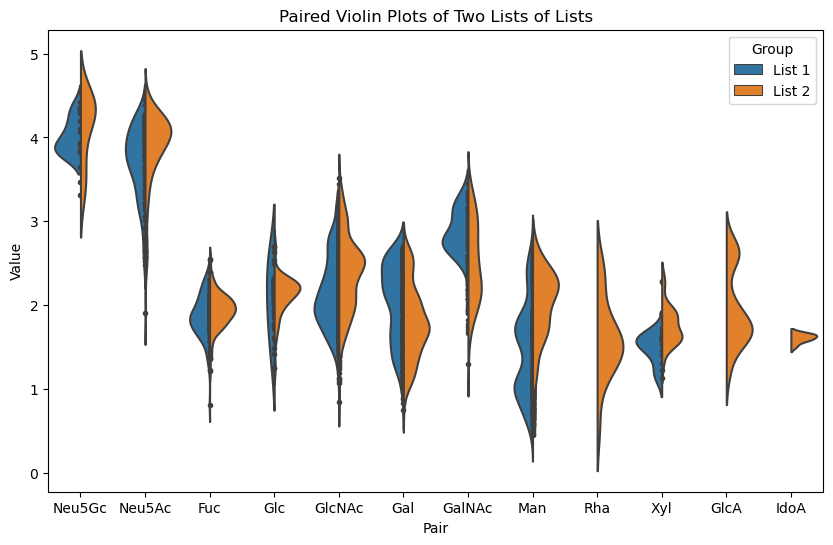

In [34]:
# N-glycans
mono_list = ['Neu5Gc', 'Neu5Ac', 'Fuc', 'Glc', 'GlcNAc', 'Gal', 'GalNAc', 'Man', 'Rha', 'Xyl', 'GlcA', 'IdoA']
nglycan_means = []
other_means = []

for mono in mono_list :
    mono_mean_flex_across_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in nglycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
                val_list = resdf['Weighted Score'][resdf['Monosaccharide'].str.contains(mono+'(', regex=False)==True].to_list()
                for v in val_list:
                    mono_mean_flex_across_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    nglycan_means.append(mono_mean_flex_across_glycans)

    #Others
    mono_mean_flex_across_other_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in other_glycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
                val_list = resdf['Weighted Score'][resdf['Monosaccharide'].str.contains(mono+'(', regex=False)==True].to_list()
                for v in val_list:
                    mono_mean_flex_across_other_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    other_means.append(mono_mean_flex_across_other_glycans)

data = []
for i, (sublist1, sublist2) in enumerate(zip(nglycan_means, other_means)):
    data.extend([(value, mono_list[i], 'List 1') for value in sublist1])
    data.extend([(value, mono_list[i], 'List 2') for value in sublist2])

# Convert to DataFrame
df = pd.DataFrame(data, columns=['Value', 'Pair', 'Group'])

# Create the paired violin plots
plt.figure(figsize=(10, 6))
sns.violinplot(x='Pair', y='Value', hue='Group', data=df, split=True, inner="point")

# Add a title
plt.title('Paired Violin Plots of Two Lists of Lists')

# Save the plot to a file
plt.savefig('paired_violinplots.png', dpi=300)

# Show the plot
plt.show()

## 3 - Silhouette analysis

In [5]:
glycoshape_glycans = get_glycoshape_IUPAC()
sil = group_by_silhouette(glycoshape_glycans)
print(sil)

#Count which topological groups are the most common --> targetting them for further analysis
c = Counter(sil['topological_group'].to_list())
print(c.most_common())

                                                glycan  \
0    Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)...   
1    Fuc(a1-3)[Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)[Fuc(...   
106                                 Neu5Ac(a2-3)GalNAc   
110                                 GlcNAc(b1-4)GlcNAc   
124                                 Neu5Ac(a2-6)GalNAc   
..                                                 ...   
517  Fuc(a1-3)[Gal(b1-4)]GlcNAc(b1-2)[GlcNAc(b1-4)]...   
518  Glc(a1-2)Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)M...   
520  Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)[Gal(b1-4)Glc...   
524  Fuc(a1-3)[Gal(b1-4)]GlcNAc(b1-2)Man(a1-3)[Fuc(...   
527  Gal(b1-3)GlcNAc(b1-3)[Gal(b1-3)GlcNAc(b1-3)[Ga...   

                  silhouette  topological_group  
0    XXX[XXX]X[XXX[XXX]X]XXX                  0  
1                X[X]XX[X]XX                  1  
106                       XX                  2  
110                       XX                  2  
124                       XX                  2  
.. 

In [97]:
sil[sil['silhouette'].values==4]

,glycan,silhouette,topological_group
127,Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu...,XXXX[XXXX]XXX,71
474,Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu...,XXXX[XXXX]XXX,71
424,Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu...,XXXX[XXXX]XXX,71
147,Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu...,XXXX[XXXX]XXX,71
173,Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu...,XXXX[XXXX]XXX,71


For a given conformational group, check if the cluster frequency distribution is the same 

In [18]:
topo_group = 4
g_with_major, g_without_major = glycan_cluster_pattern(threshold = 50) 
topo_major = []
topo_other = []
print("Glycans with one major cluster:\n")
for g in sil['glycan'][sil['topological_group']==topo_group].to_list():
    if g in g_with_major :
        print(g + ' ' + str(get_glycan_clusters_frequency(g)))
        topo_major.append(g)

print("\nGlycans without a major cluster:\n")
for g in sil['glycan'][sil['topological_group']==topo_group].to_list():
    if g in g_without_major :
        print(g + ' ' + str(get_glycan_clusters_frequency(g)))
        topo_other.append(g)

Number of glycans with one major cluster: 104
Number of glycans without a major cluster: 344
Glycans with one major cluster:

GlcA3S(b1-3)Gal(b1-4)GlcNAc [54.75, 20.05, 10.46, 8.87, 5.87]
Neu5Gc(a2-3)Gal(b1-4)Glc [56.67, 28.43, 14.9]
Neu5Ac(a2-3)Gal(b1-3)GlcNAc [74.11, 21.74, 4.15]
Gal(b1-6)Gal(b1-4)Glc [60.12, 16.0, 15.16, 8.73]
Neu5Ac(a2-6)Gal(b1-4)GlcNAc [50.72, 25.52, 23.75]
Neu5Gc9Me(a2-3)Gal(b1-3)GlcNAc [67.48, 18.27, 14.25]
GlcNAc(b1-3)Gal(b1-4)Glc [54.23, 35.53, 10.24]
GalNAc(b1-3)GlcNAc(b1-4)Man [94.77, 3.43, 1.8]
Neu5Gc(a2-3)Gal(b1-4)GlcNAc [55.73, 22.87, 10.93, 10.48]
Neu5Ac(a2-6)GalNAc(b1-3)GlcNAc [52.41, 24.52, 23.07]
Neu5Ac9Me(a2-3)Gal(b1-3)GlcNAc [51.59, 31.63, 16.78]
Neu5Ac(a2-6)Gal(b1-4)Glc [52.44, 25.36, 22.19]

Glycans without a major cluster:

Neu5Ac(a2-6)GalNAc(a1-3)GalNAc [22.56, 15.58, 12.78, 11.39, 9.97, 8.2, 6.36, 5.04, 4.54, 3.58]
Neu5Gc(a2-3)Gal(b1-3)GlcNAc [21.8, 18.2, 17.57, 15.39, 8.44, 8.36, 3.96, 3.48, 2.8]
GalNAc(b1-4)Gal(b1-4)Glc [32.15, 26.71, 23.84, 

In [26]:
#for all topological groups, show the number of glycans with one major cluster vs no major cluster for a given threshold (50?)

g_with_major, g_without_major = glycan_cluster_pattern(threshold = 50) 
topo_list = []
nb_with_major = []
nb_without_major = []
tot_list = []


for topo_group in range(0,201):
    topo_list.append(topo_group)

    topo_major = []
    topo_other = []
    for g in sil['glycan'][sil['topological_group']==topo_group].to_list():
        if g in g_with_major :
            topo_major.append(g)

    for g in sil['glycan'][sil['topological_group']==topo_group].to_list():
        if g in g_without_major :
            topo_other.append(g)
    tot = len(topo_major) + len(topo_other)
    tot_list.append(tot)
    try :
        topo_major = len(topo_major)/tot*100
    except : 
        topo_major = 0
    
    try :
        topo_other = len(topo_other)/tot*100
    except :
        topo_other = 0


    nb_with_major.append(topo_major)
    nb_without_major.append(topo_other)

sil_clust = pd.DataFrame()
sil_clust['Group'] = topo_list
sil_clust['Percent_with_major_clust'] = nb_with_major
sil_clust['Percent_without_major_clust'] = nb_without_major
sil_clust['Total_number_of_glycans'] = tot_list

Number of glycans with one major cluster: 117
Number of glycans without a major cluster: 406


In [29]:
sil_clust

,Group,Percent_with_major_clust,Percent_without_major_clust,Total_number_of_glycans
2,2,24.000000,76.000000,25
3,3,0.000000,100.000000,4
4,4,27.450980,72.549020,51
6,6,22.916667,77.083333,48
12,12,0.000000,100.000000,4
14,14,9.090909,90.909091,11
15,15,16.666667,83.333333,6
16,16,11.111111,88.888889,9
21,21,20.000000,80.000000,25
24,24,38.461538,61.538462,13


In [30]:
# which groups have more than 75% of there glycans that have (or haven't) a major cluster?

#pre-select only clusters with at least a total of 10 glycans
sil_clust=sil_clust[sil_clust['Total_number_of_glycans'].values >= 4]
sil_with_major = sil_clust['Group'][sil_clust['Percent_with_major_clust'].values >= 50].to_list()

sil_without_major = sil_clust['Group'][sil_clust['Percent_without_major_clust'].values >= 50].to_list()

print("Silhouettes with more than 75 of their glycans with a major cluster")
for s in sil_with_major :
    print(sil['silhouette'][sil['topological_group'].values==s].to_list()[0])

print("Silhouettes with more than 75 of their glycans without a major cluster")
for s in sil_without_major :
    print(str(s) + ' ' + sil['silhouette'][sil['topological_group'].values==s].to_list()[0])


Silhouettes with more than 75 of their glycans with a major cluster
X
Silhouettes with more than 75 of their glycans without a major cluster
2 XX
3 X[X]XXXXX
4 XXX
6 XXXX
12 XXX[XXX]XX[X]X
14 XX[X]X
15 XX[X]XXX
16 X[X]XX
21 XXXXX
24 X[X]XXX
25 X[X]X
31 XX[X]XX
41 XX[XXX]X
42 XXXX[XXXX]XX[X]X
55 XXXXXXXXXX
56 X[X]X[X]X
63 XXXXXXXX
71 XXXX[XXXX]XXX
77 XXXXXX
89 XXX[XXX]X
114 XXXXXXXXXXX


No glycan silhouette (larger than 4 glycans) contains more than 50% of glycans with a major cluster. However, several glycan silhouettes have a very low number of glycans with a major cluster.

7 silhouettes contain more than 90% of glycans without a major cluster: 
- X[X]XXXXX
- XXX[XXX]XX[X]X
- XX[X]X
- XXXX[XXXX]XX[X]X
- XXXXXXXX
- XXXXXX
- XXX[XXX]X

They can be grouped in 3 categories:
- XX[X]X-root and/or XXX[XXX]X terminated:
    XX[X]X
    XXX[XXX]X
    XXX[XXX]XX[X]X
    XXXX[XXXX]XX[X]X
- linear:
    XXXXXX
    XXXXXXXX
- other:
    X[X]XXXXX



In [32]:
#what are these glycans?

sil_without_major = sil_clust['Group'][sil_clust['Percent_without_major_clust'].values >= 90].to_list()
for s in sil_without_major :
    print(sil['silhouette'][sil['topological_group'].values==s].to_list()[0])
    c_list = sil['glycan'][sil['topological_group'].values==s].to_list()
    for g in c_list :
        print(g)




X[X]XXXXX
GalNAc(a1-3)[Fuc(a1-2)]Gal(b1-4)GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)GalNAc
GalNAc(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc
Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc
Gal(b1-3)[Fuc(a1-4)]GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Gal(b1-4)Glc
XXX[XXX]XX[X]X
Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc
Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc
Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc
Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc6S(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc
XX[X]X
Fuc(a1-2)Gal(b1-4)[Fuc(a1-3)]GlcNAc
Fuc(a1-2)Gal(b1-3)[Fuc(a1-4)]GlcNAc
Neu5Ac(a2-3)Gal(b1-3)[Neu5Ac(a2-6)]GalNAc
Neu5Ac(a2-3)Gal(b1-4)[Fuc(a1-3)]GlcNAc
Neu5Ac9Ac(a2-3)Gal(b1-4)[Fuc(a1-3)]GlcNAc
Ara(b1-2)Ara(b1-2)[Ara(a1-3)]Ara
Neu5Gc(a2-3)Gal(b1-3)[Fuc(a1-4)]GlcNAc
Fuc(a1-3)GlcNAc(b1-6)[Gal(b1

Conclusion: In most cases, silhouettes DO NOT determine if the corresponding glycans will have a major cluster or not. Composition and sequence seem more important to determine glycan structural properties. Even when silhouettes do show almost all corresponding glycans to have (or not) a major cluster, it is in fact because they show a highly similar composition. 
It also means that glycans with the same silhouette can have very different structural behaviors because of a different composition or linkage. This will be studied below using sialylated N-glycans.

In [206]:
# Do monosaccharides in glycans with a given silhouette have similar structural properties when at the same position, even if different?

#group 42 and 71
glycan_list = sil['glycan'][sil['topological_group'].values==15].to_list()

list_of_res = []
list_of_mono = []
dict_res = {}
valid_list = []
for g in glycan_list :
    print(g)
    my_glycans_path = "glycans_pdb/"
    try :
        currlist = []
        resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
        res = [v for v in resdf['Weighted Score'].to_list()]
        if len(res) != len(g.split('-'))+1:
            break
        monolist = [v for v in resdf['Monosaccharide'].to_list()]
        list_of_res.append(res)
        dict_res[g] = res
        
        for x in range(0,len(res)):
            currlist.append(monolist[x].replace('(','\n(') + '\n' + str(round(res[x],ndigits= 2)))
            print(monolist[x] + ' : ' + str(res[x]))
        list_of_mono.append(currlist)
        valid_list.append(g)
    except: 
        print("This glycan failed: " + g)
        



Fuc(a1-2)Gal(b1-3)[Fuc(a1-4)]GlcNAc(b1-3)Gal(b1-4)Glc
-R : 0.5106130885113978
Glc(b1-1) : 2.2451984972124004
Gal(b1-4) : 1.743628703584237
GlcNAc(b1-3) : 1.7430793490274556
Fuc(a1-4) : 1.8659638523544158
Gal(b1-3) : 1.670741227260201
Fuc(a1-2) : 1.9105833701809394
Fuc(a1-4)Gal(b1-3)[Neu5Ac(a2-6)]GlcNAc(b1-3)Gal(b1-4)Glc
-R : 0.5185962250507804
Glc(b1-1) : 2.242972410572006
Gal(b1-4) : 1.7217844626180432
GlcNAc(b1-3) : 1.8126519713179015
Neu5Ac(a2-6) : 3.7830560238656425
Gal(b1-3) : 1.6570706660768726
Fuc(a1-4) : 2.0943138511110195
GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
-R : 0.5135450113475323
GlcNAc(b1-1) : 2.868738717648824
GlcNAc(b1-4) : 2.457196475975693
Man(b1-4) : 1.2516446115010886
Man(a1-6) : 2.6514204433767707
Man(a1-3) : 1.8165276537044441
GlcNAc(b1-2) : 3.2090858053456066
Gal(a1-3)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-3)Gal(b1-4)Glc
This glycan failed: Gal(a1-3)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-3)Gal(b1-4)Glc
Neu5Ac(a2-3)Gal(b1-3)[Neu5Ac(a2-6)]GlcNAc(b1-3)Gal(b1-4)Gl

<Figure size 1000x600 with 0 Axes>

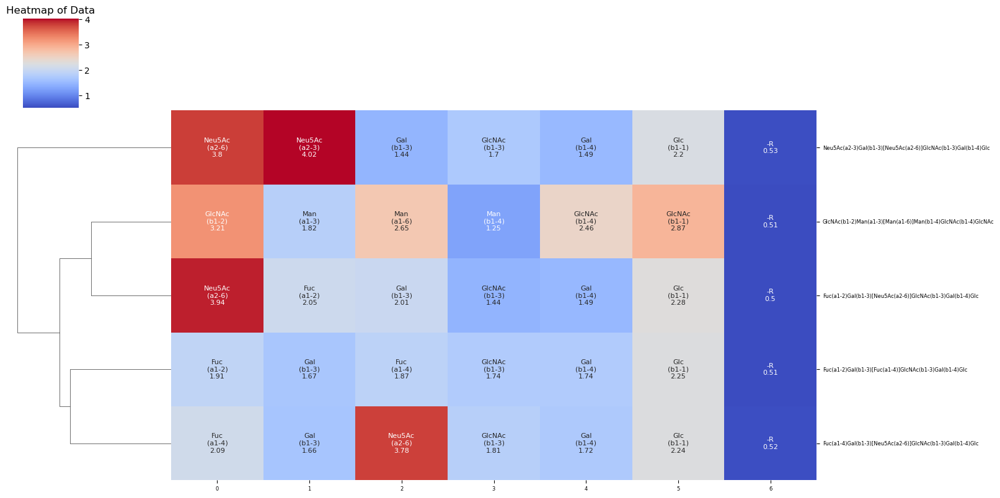

In [207]:
# Create the heatmap
data_inverted = [row[::-1] for row in list_of_res]
annotations_inverted = [row[::-1] for row in list_of_mono]  # Reverses each row (i.e., the columns)

plt.figure(figsize=(10, 6))  # Adjust size if needed
g = sns.clustermap(data_inverted, annot=annotations_inverted, fmt="", cmap="coolwarm", yticklabels=valid_list, row_cluster=True, col_cluster=False, figsize=(18, 8), annot_kws={"size": 8})
# Adjust the font size of the column and row labels
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=6)  # Decrease column label font size
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=6)  # Decrease column label font size
# Rotate column labels if necessary

# Show the heatmap
plt.title('Heatmap of Data')
plt.show()

In [208]:

glycan_list = sil['glycan'][sil['topological_group'].values==15].to_list()

list_of_res = []
list_of_mono = []
dict_res = {}
valid_list = []
for g in glycan_list :
    print(g)
    my_glycans_path = "glycans_pdb/"
    try :
        isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted' )
        res = overall_monosaccharide_flexibility(isvt, mode='mean')
        if len(res) != len(g.split('-'))+1:
            break
        print(res)
        val_list = [res[key] for key in res]
        mono_list = [key.replace('(','\n(') + '\n' + str(round(res[key],ndigits= 2)) for key in res]
        list_of_res.append(val_list)
        dict_res[g] = res
        list_of_mono.append(mono_list)
        valid_list.append(g)

    except: 
        print("This glycan failed: " + g)

Fuc(a1-2)Gal(b1-3)[Fuc(a1-4)]GlcNAc(b1-3)Gal(b1-4)Glc
{'1_-R': 3.591241174117412, '2_Glc(b1-1)': 3.117520264526457, '3_Gal(b1-4)': 2.054759425942592, '4_GlcNAc(b1-3)': 1.8953694619461918, '5_Fuc(a1-4)': 2.505910691069103, '6_Gal(b1-3)': 2.1300516926692636, '7_Fuc(a1-2)': 2.6520025252525263}
Fuc(a1-4)Gal(b1-3)[Neu5Ac(a2-6)]GlcNAc(b1-3)Gal(b1-4)Glc
{'1_-R': 10.850167408259168, '2_Glc(b1-1)': 8.962870287971203, '3_Gal(b1-4)': 5.10283641635836, '4_GlcNAc(b1-3)': 2.3138478902109796, '5_Neu5Ac(a2-6)': 15.522997075292466, '6_Gal(b1-3)': 8.52276802319768, '7_Fuc(a1-4)': 14.270145635436455}
GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
{'1_-R': 9.508139000000007, '2_GlcNAc(b1-1)': 7.724905266666669, '3_GlcNAc(b1-4)': 4.981612766666668, '4_Man(b1-4)': 2.0884425333333403, '5_Man(a1-6)': 6.541647233333337, '6_Man(a1-3)': 2.3696724999999943, '7_GlcNAc(b1-2)': 14.44130690000001}
Gal(a1-3)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-3)Gal(b1-4)Glc
This glycan failed: Gal(a1-3)Gal(b1-4)[Fuc(a1-3)]GlcNA

<Figure size 1000x600 with 0 Axes>

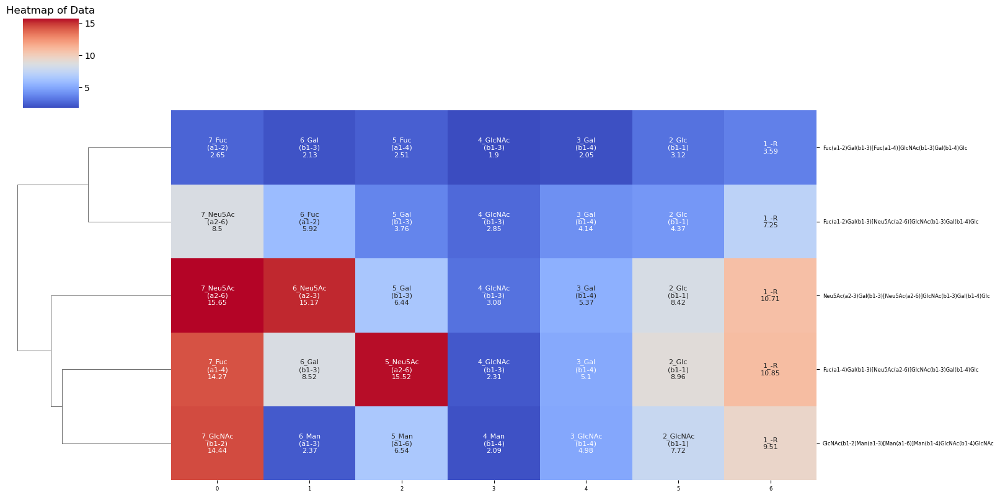

In [209]:
#/!\ les effets vus précédemment avec les branches Neu5Ac ne fonctionnent pas en weighted!


# Create the heatmap
data_inverted = [row[::-1] for row in list_of_res]
annotations_inverted = [row[::-1] for row in list_of_mono]  # Reverses each row (i.e., the columns)

plt.figure(figsize=(10, 6))  # Adjust size if needed
g = sns.clustermap(data_inverted, annot=annotations_inverted, fmt="", cmap="coolwarm", yticklabels=valid_list, row_cluster=True, col_cluster=False, figsize=(18, 8), annot_kws={"size": 8})
# Adjust the font size of the column and row labels
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=6)  # Decrease column label font size
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=6)  # Decrease column label font size
# Rotate column labels if necessary

# Show the heatmap
plt.title('Heatmap of Data')
plt.show()

## 4 - N-glycan biosynthesis

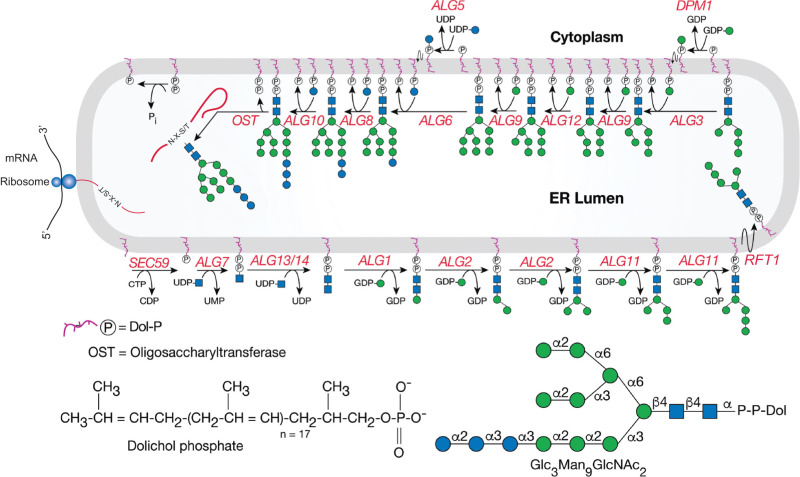

In [222]:
nglycan_path = ['GlcNAc','GlcNAc(b1-4)GlcNAc','Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-3)Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-3)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Glc(a1-2)Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc']

This glycan failed: GlcNAc
-R : 0.4705331558614969
GlcNAc(b1-1) : 2.801295384644577
GlcNAc(b1-4) : 3.2938918659032907
-R : 0.42867445393465464
GlcNAc(b1-1) : 2.877753615277843
GlcNAc(b1-4) : 2.619680749829649
Man(b1-4) : 2.5937559717880103
This glycan failed: Man(a1-3)Man(b1-4)GlcNAc(b1-4)GlcNAc
-R : 0.46261512198597193
GlcNAc(b1-1) : 2.8792579362440502
GlcNAc(b1-4) : 2.4421070053226313
Man(b1-4) : 1.1034953833537875
Man(a1-6) : 2.76768229887049
Man(a1-3) : 2.5584251712387895
This glycan failed: Man(a1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-3)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
-R : 0.4717589062407613
GlcNAc(b1-1) : 2.6636482112832134
GlcNAc(b1-4) : 1.7421617872090778
Man(b1-4) : 0.8671359575405252
Man(a1-3) : 1.778388873619854
Man(

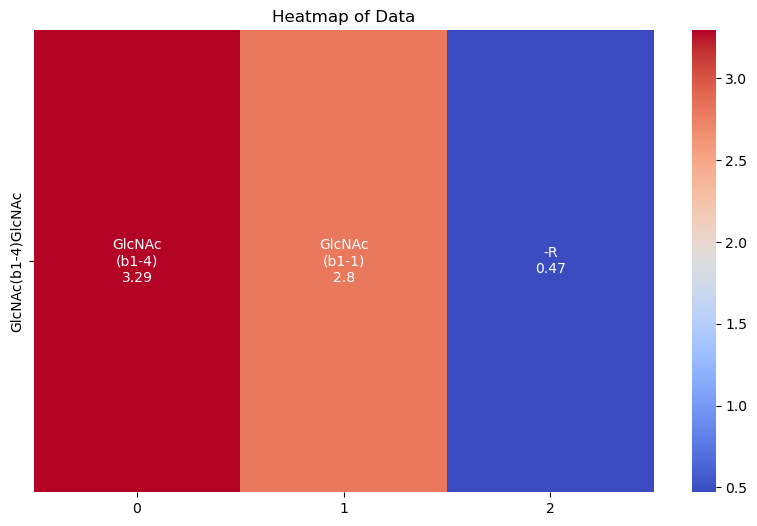

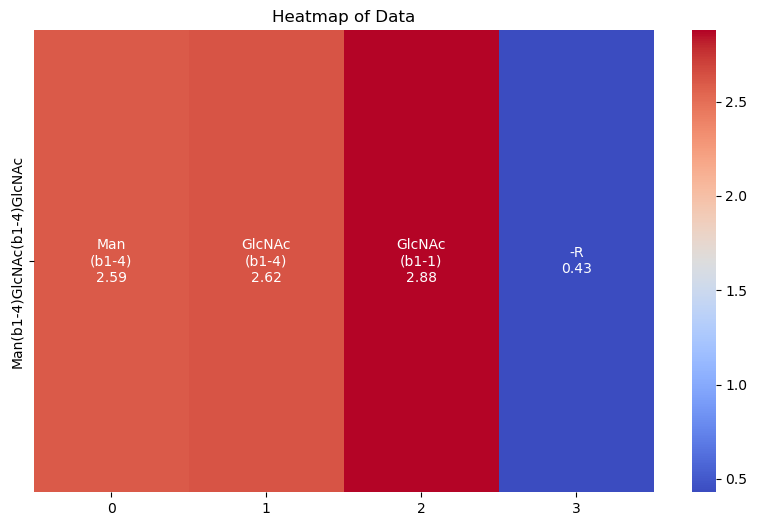

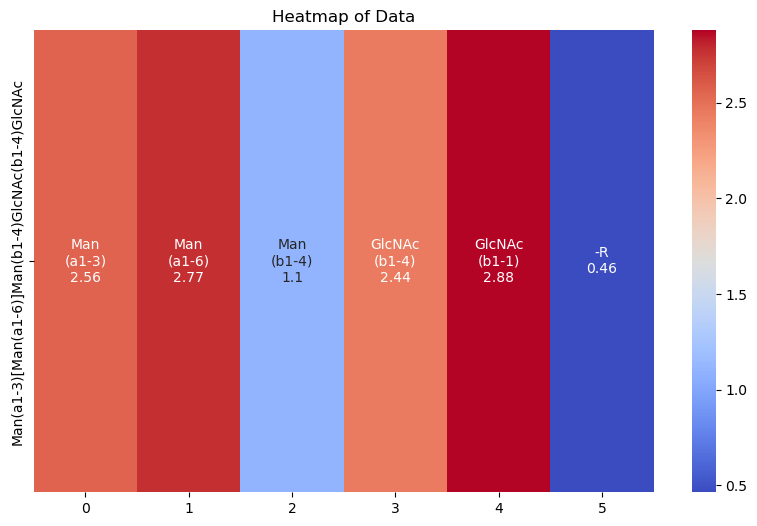

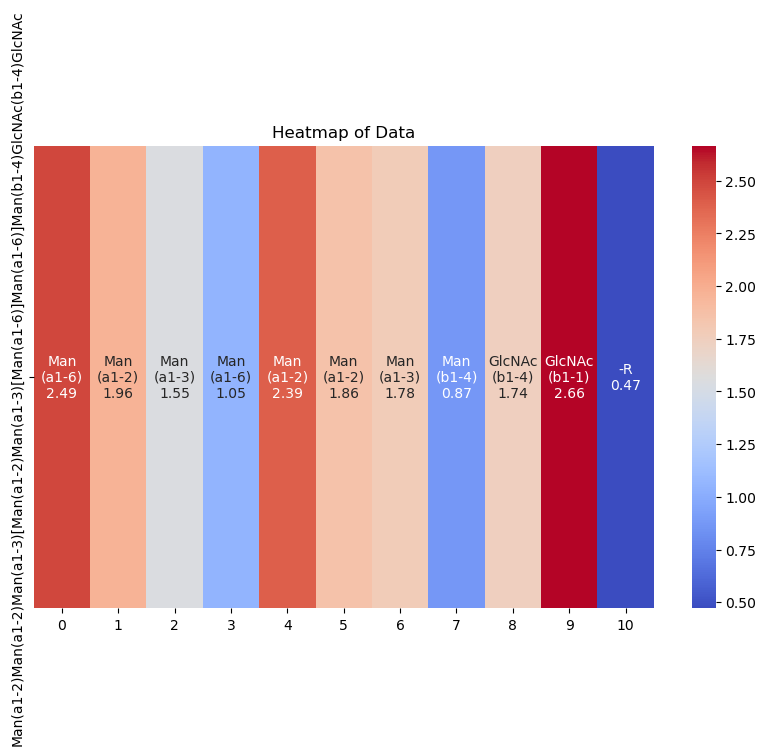

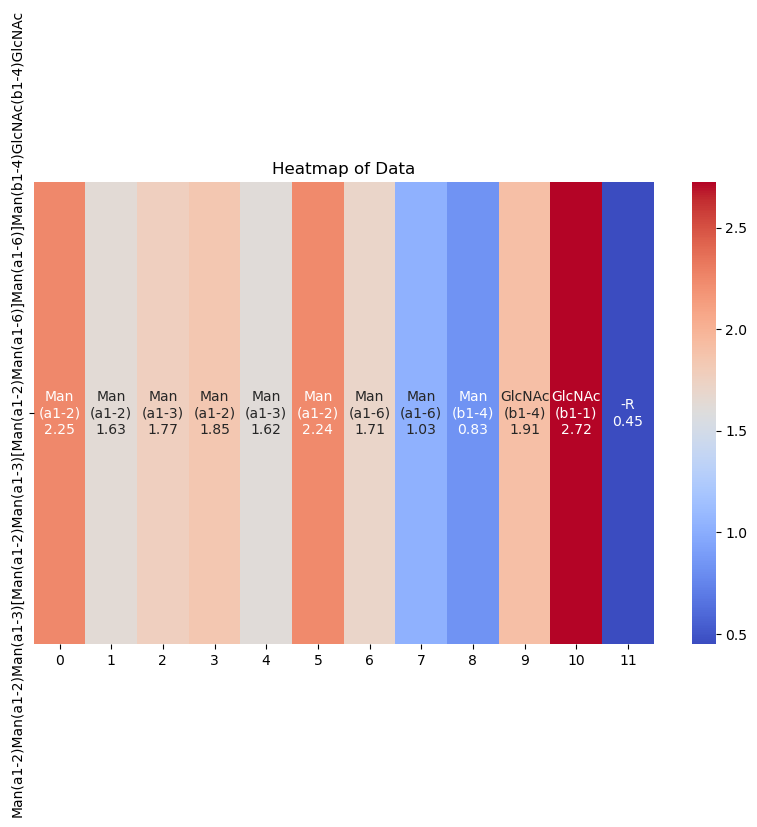

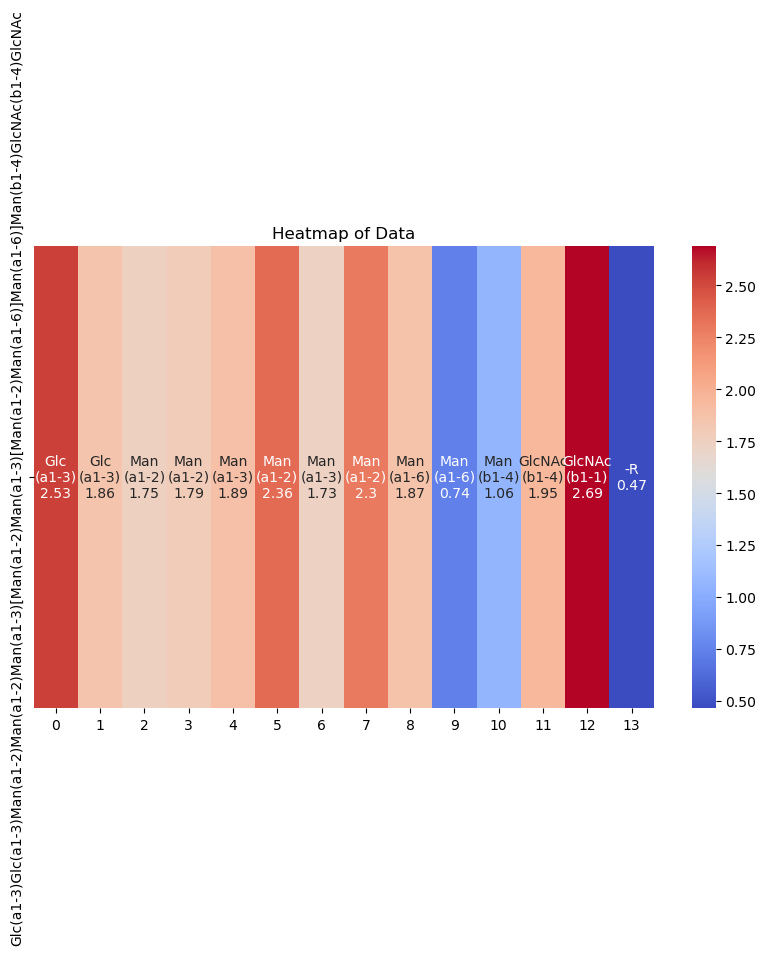

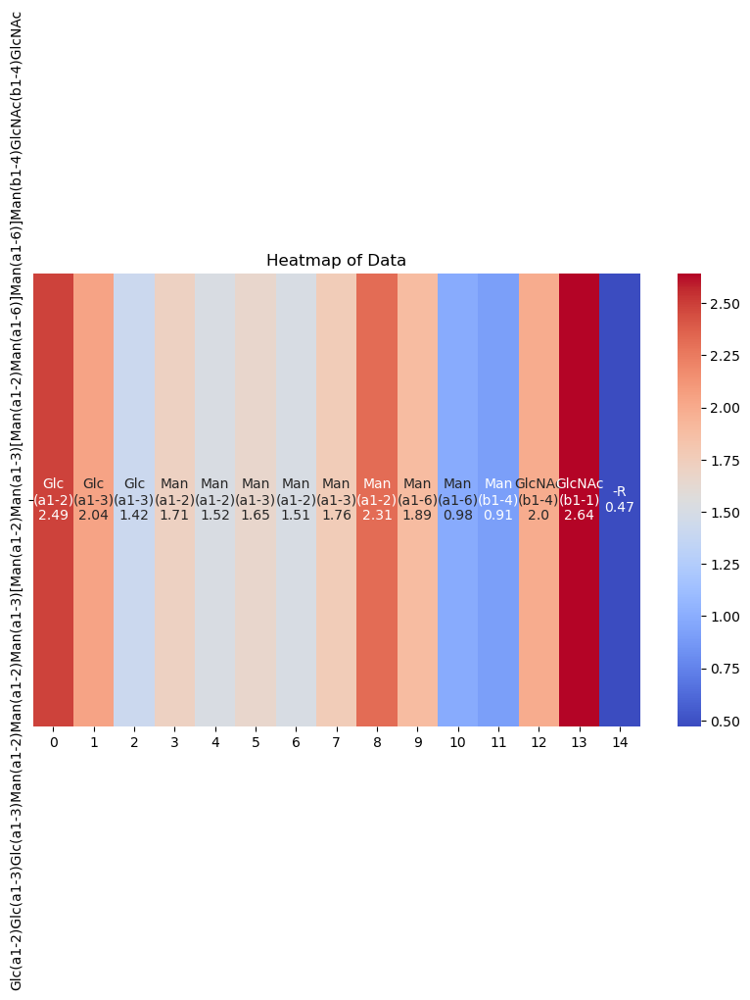

In [225]:
for g in nglycan_path :
    list_of_res = []
    list_of_mono = []
    dict_res = {}
    valid_list = []
    my_glycans_path = "glycans_pdb/"
    try :
        currlist = []
        resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
        res = [v for v in resdf['Weighted Score'].to_list()]
        monolist = [v for v in resdf['Monosaccharide'].to_list()]
        list_of_res.append(res)
        dict_res[g] = res
        
        for x in range(0,len(res)):
            currlist.append(monolist[x].replace('(','\n(') + '\n' + str(round(res[x],ndigits= 2)))
            print(monolist[x] + ' : ' + str(res[x]))
        list_of_mono.append(currlist)
        valid_list.append(g)
        data_inverted = [row[::-1] for row in list_of_res]
        annotations_inverted = [row[::-1] for row in list_of_mono]  # Reverses each row (i.e., the columns)

        plt.figure(figsize=(10, 6))  # Adjust size if needed
        sns.heatmap(data_inverted, annot=annotations_inverted, fmt="", cmap="coolwarm", yticklabels=valid_list)
        # Adjust the font size of the column and row labels

        # Rotate column labels if necessary

        # Show the heatmap
        plt.title('Heatmap of Data')
        plt.savefig(str(g) + '_heatmap_SASA.png', dpi=300, bbox_inches='tight')

    except: 
        print("This glycan failed: " + g)
    

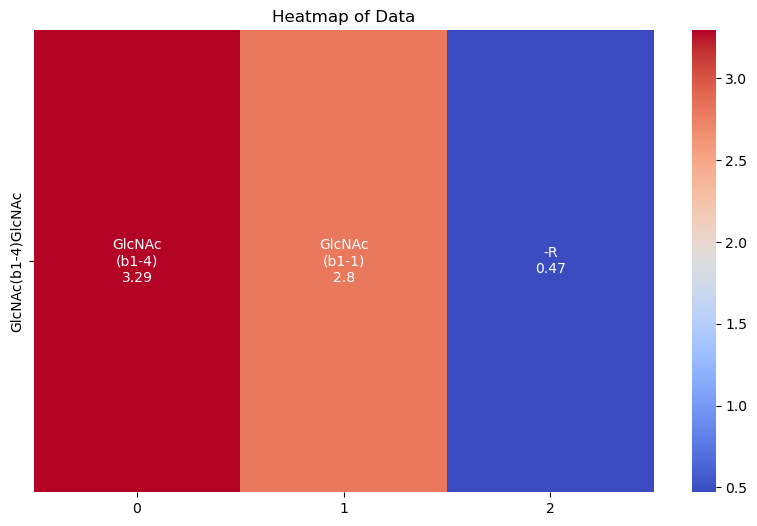

In [217]:
# Create the heatmap


This glycan failed: GlcNAc
This glycan failed: Man(a1-3)Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Man(a1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-3)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc


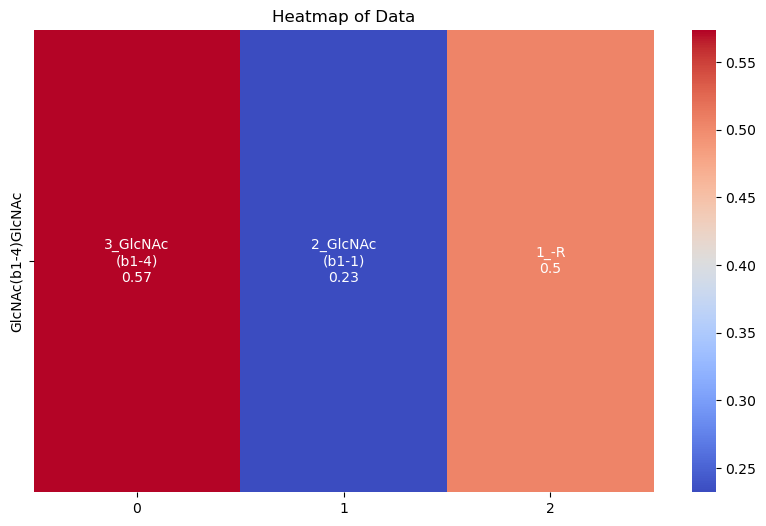

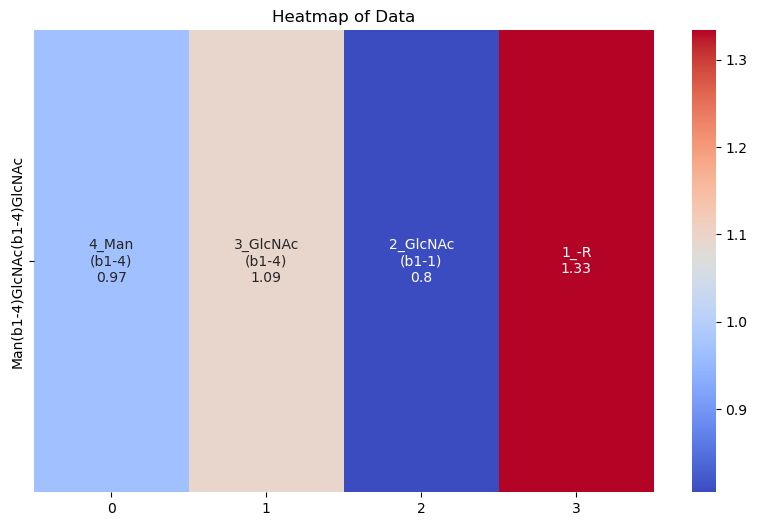

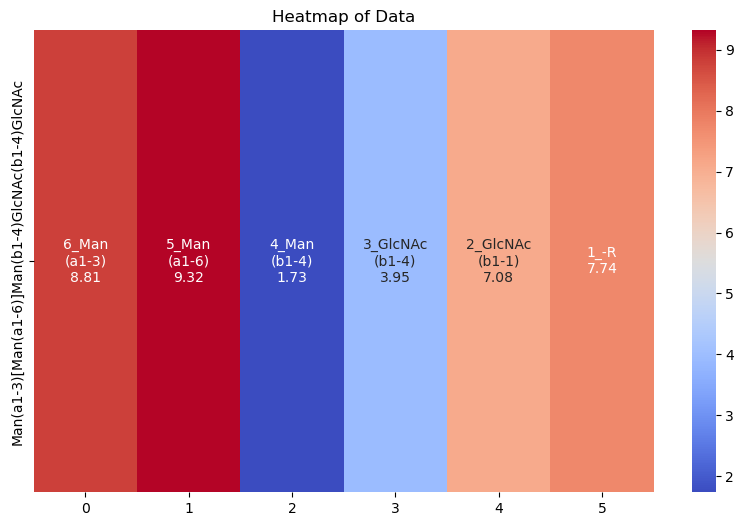

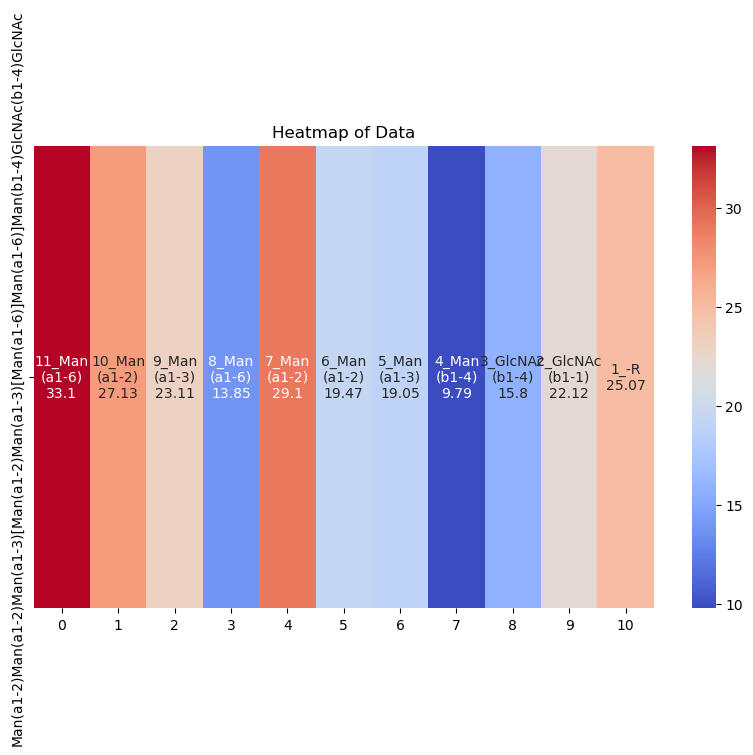

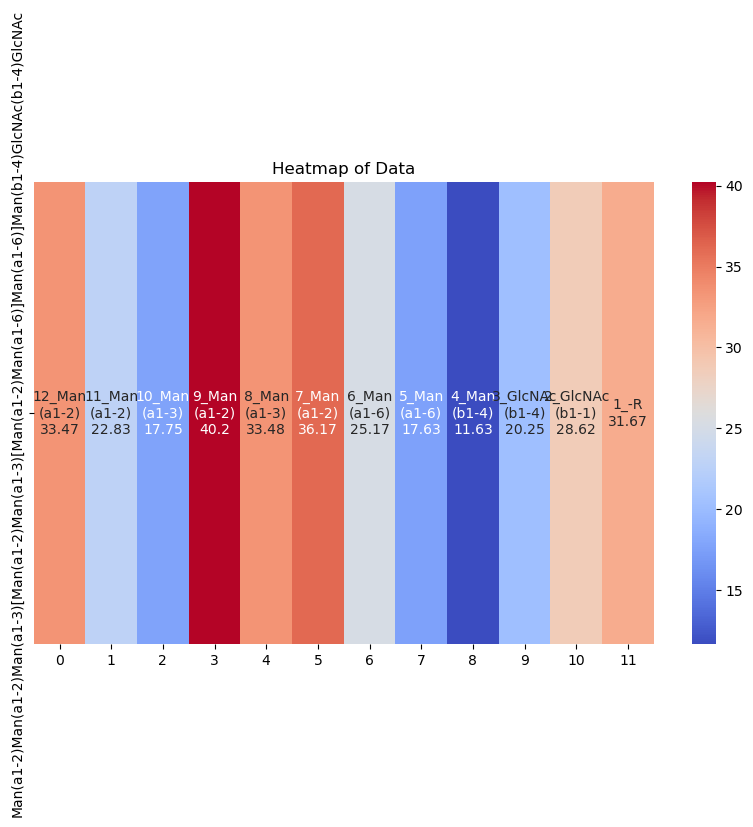

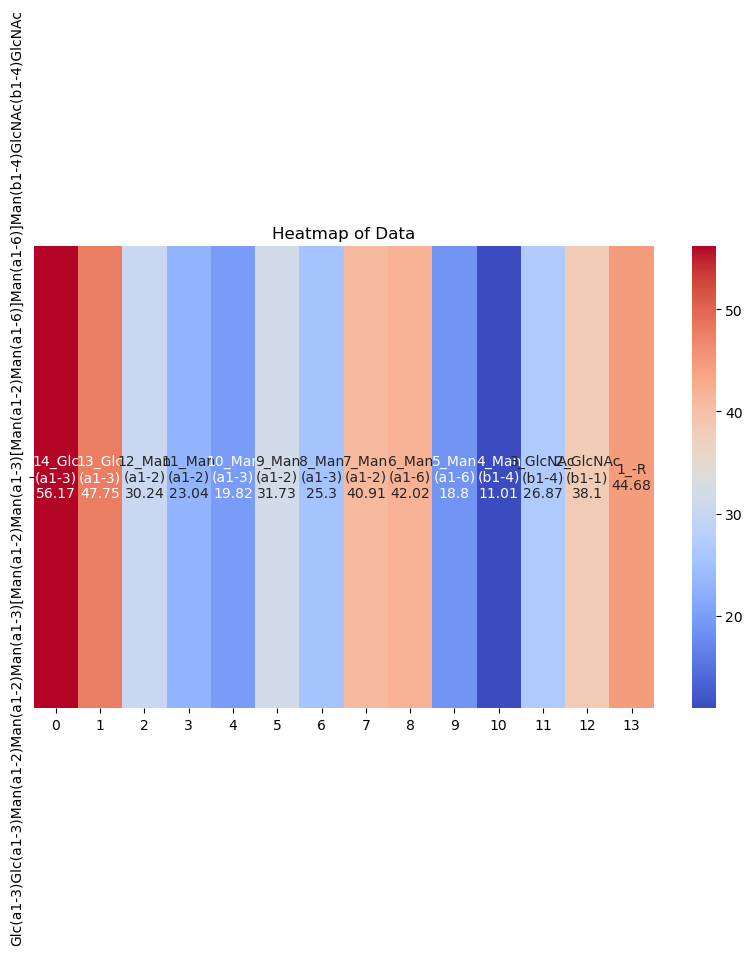

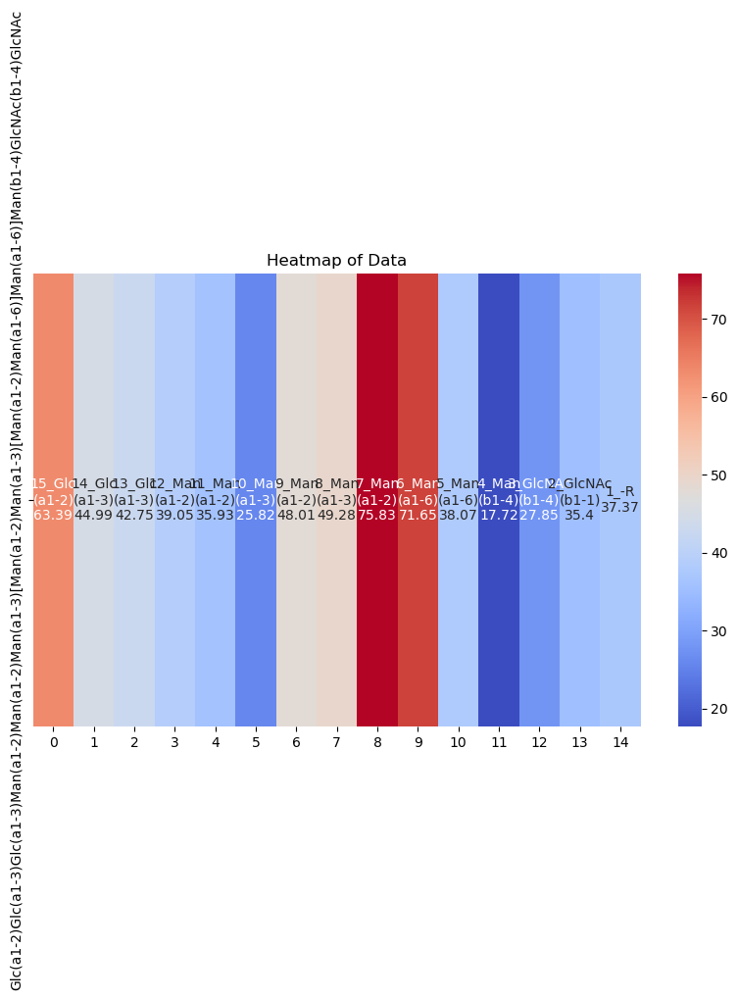

In [226]:
for g in nglycan_path :
    list_of_res = []
    list_of_mono = []
    dict_res = {}
    valid_list = []
    my_glycans_path = "glycans_pdb/"
    try :
        currlist = []
        isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted' )
        res = overall_monosaccharide_flexibility(isvt, mode='mean')
        val_list = [res[key] for key in res]
        mono_list = [key.replace('(','\n(') + '\n' + str(round(res[key],ndigits= 2)) for key in res]
        list_of_res.append(val_list)
        dict_res[g] = res
        list_of_mono.append(mono_list)
        valid_list.append(g)


        data_inverted = [row[::-1] for row in list_of_res]
        annotations_inverted = [row[::-1] for row in list_of_mono]  # Reverses each row (i.e., the columns)


        plt.figure(figsize=(10, 6))  # Adjust size if needed
        sns.heatmap(data_inverted, annot=annotations_inverted, fmt="", cmap="coolwarm", yticklabels=valid_list)
        # Adjust the font size of the column and row labels

        # Rotate column labels if necessary

        # Show the heatmap
        plt.title('Heatmap of Data')
        plt.savefig(str(g) + '_heatmap_flexibility.png', dpi=300, bbox_inches='tight')

    except: 
        print("This glycan failed: " + g)
    

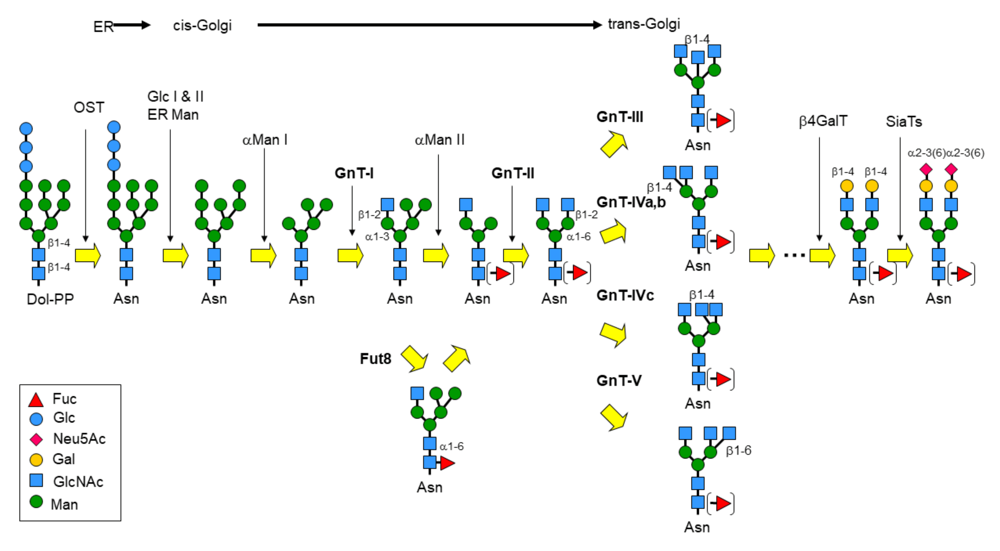

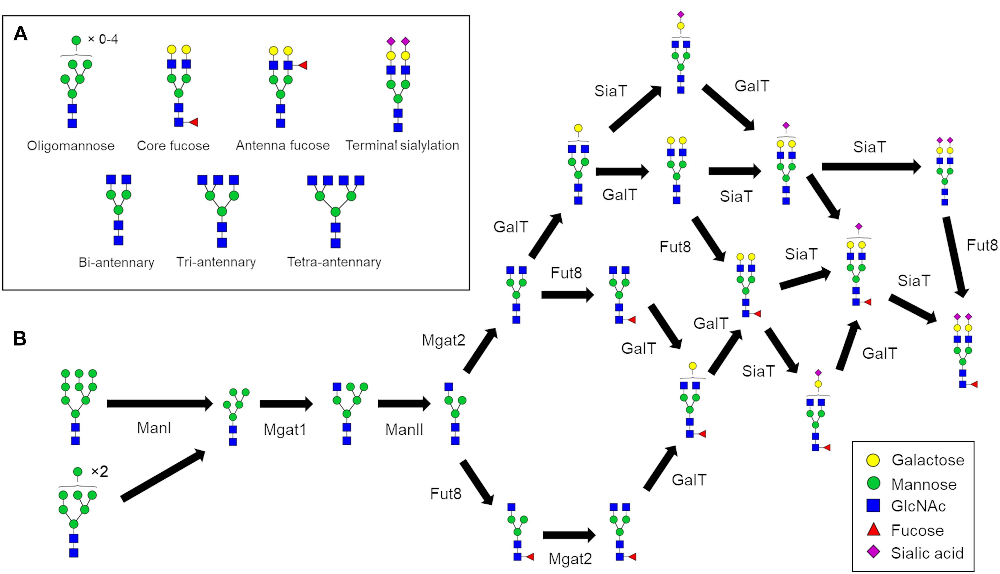

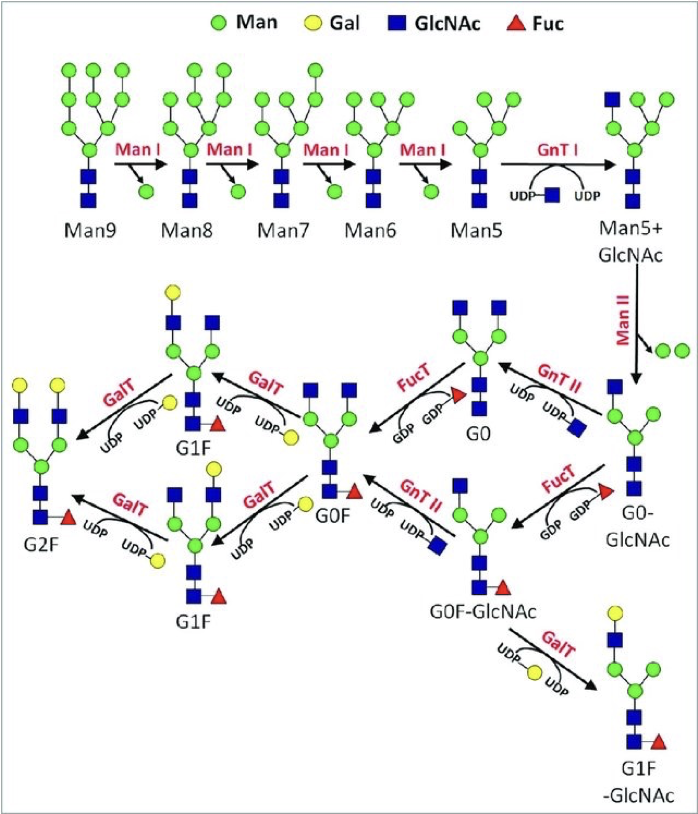

In [233]:
## Part II
nglycan_path = ['Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-2)Man(a1-3)[Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','Man(a1-2)Man(a1-3)[Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Man(a1-3)[Man(a1-6)]Man(a1-6)[Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc','GlcNAc(b1-2)Man(a1-3)[Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc','GlcNAc(b1-2)Man(a1-3)[Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Man(a1-3)[GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'GlcNAc(b1-2)Man(a1-3)[GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc','GlcNAc(b1-2)Man(a1-3)[GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc','GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc','Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc','Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                ]



In [232]:
for g in nglycan_path :
    list_of_res = []
    list_of_mono = []
    dict_res = {}
    valid_list = []
    my_glycans_path = "glycans_pdb/"
    try :
        currlist = []
        resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
        res = [v for v in resdf['Weighted Score'].to_list()]
        monolist = [v for v in resdf['Monosaccharide'].to_list()]
        list_of_res.append(res)
        dict_res[g] = res
        
        for x in range(0,len(res)):
            currlist.append(monolist[x].replace('(','\n(') + '\n' + str(round(res[x],ndigits= 2)))
            print(monolist[x] + ' : ' + str(res[x]))
        list_of_mono.append(currlist)
        valid_list.append(g)
        data_inverted = [row[::-1] for row in list_of_res]
        annotations_inverted = [row[::-1] for row in list_of_mono]  # Reverses each row (i.e., the columns)

        plt.figure(figsize=(10, 6))  # Adjust size if needed
        sns.heatmap(data_inverted, annot=annotations_inverted, fmt="", cmap="coolwarm", yticklabels=valid_list)
        # Adjust the font size of the column and row labels

        # Rotate column labels if necessary

        # Show the heatmap
        plt.title('Heatmap of Data')
        plt.savefig(str(g) + '_heatmap_SASA.png', dpi=300, bbox_inches='tight')

    except: 
        print("This glycan failed: " + g)
    

This glycan failed: GlcNAc(b1-2)Man(a1-3)[Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc


This glycan failed: GlcNAc(b1-2)Man(a1-3)[Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc


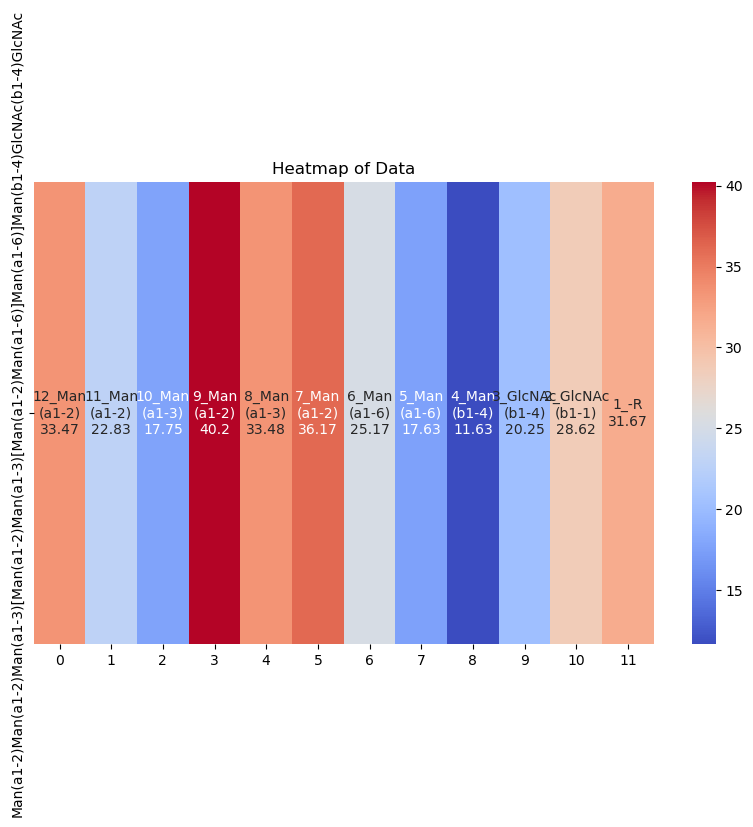

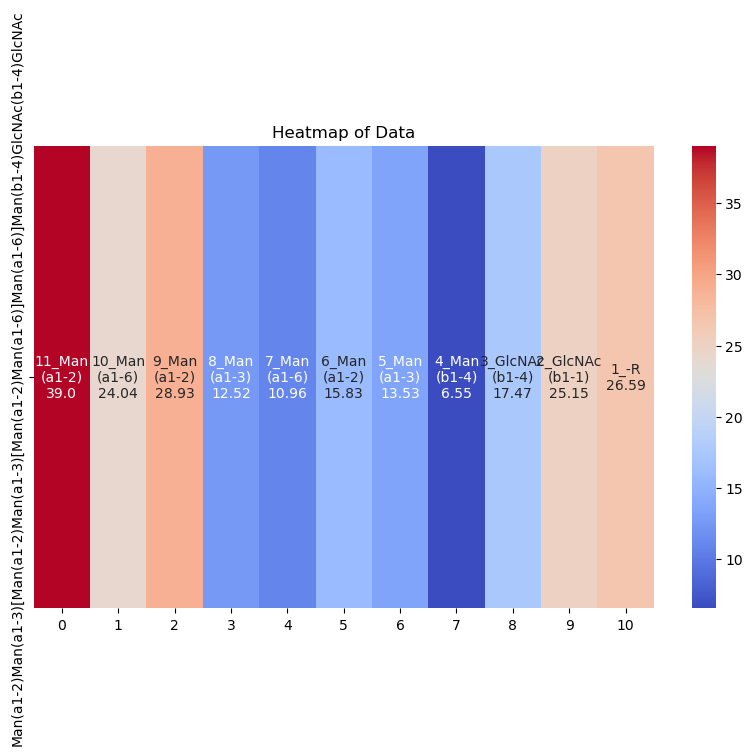

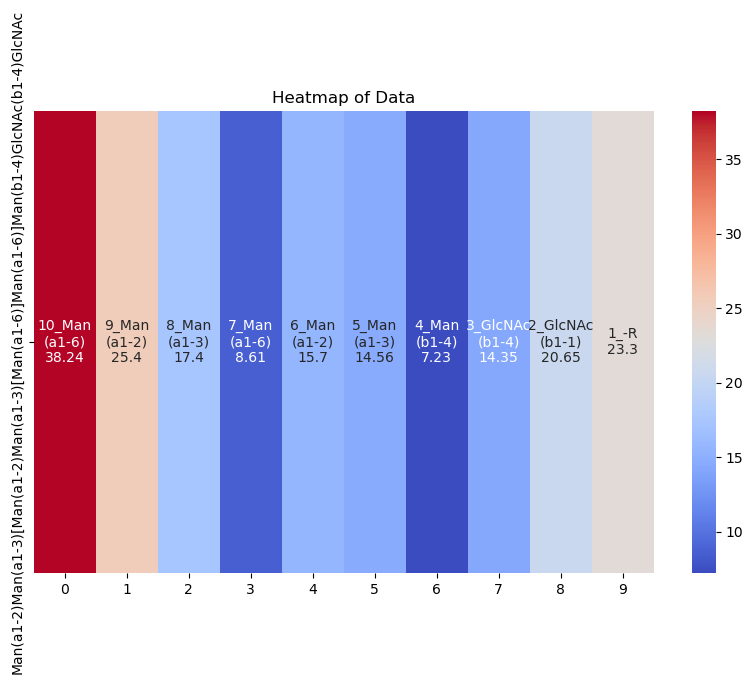

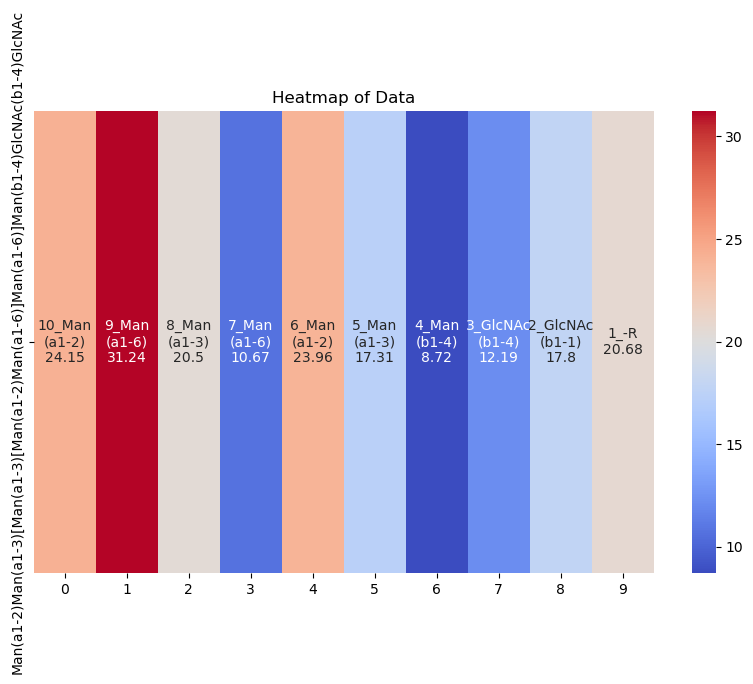

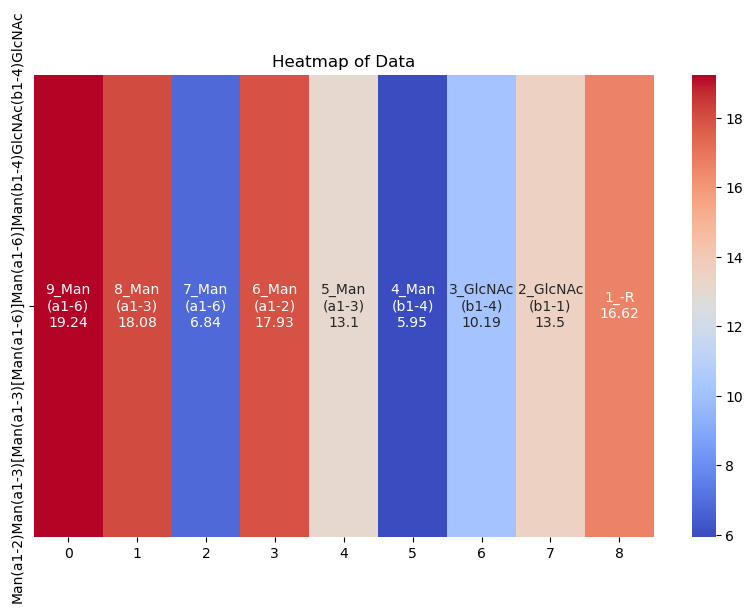

...

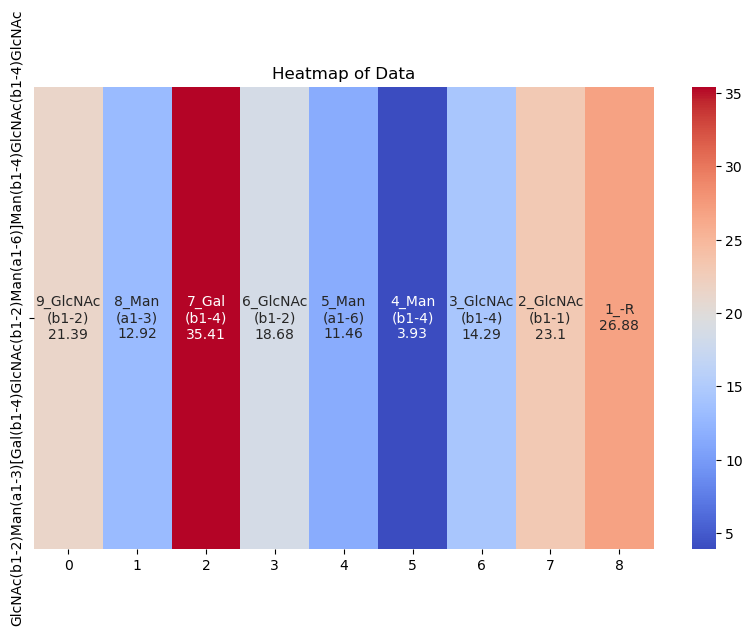

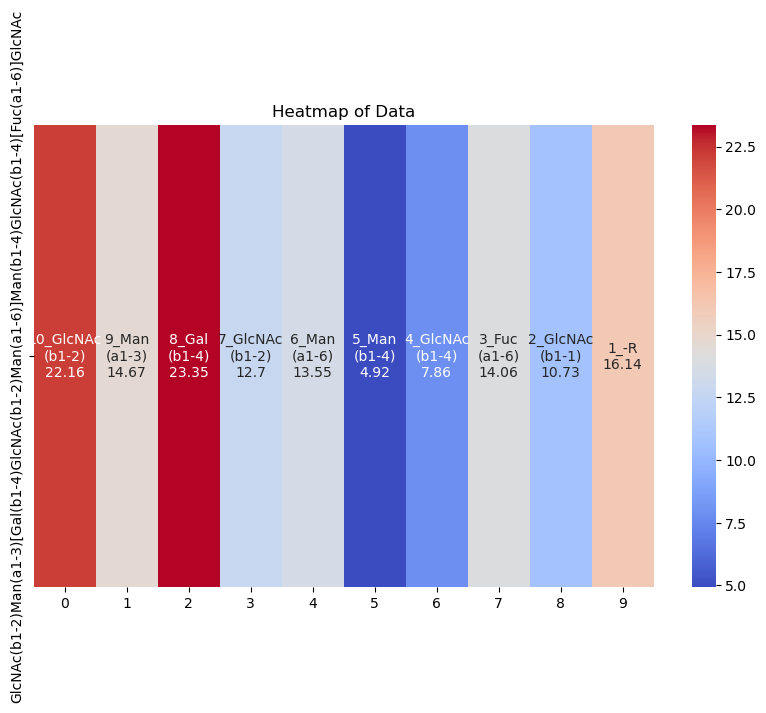

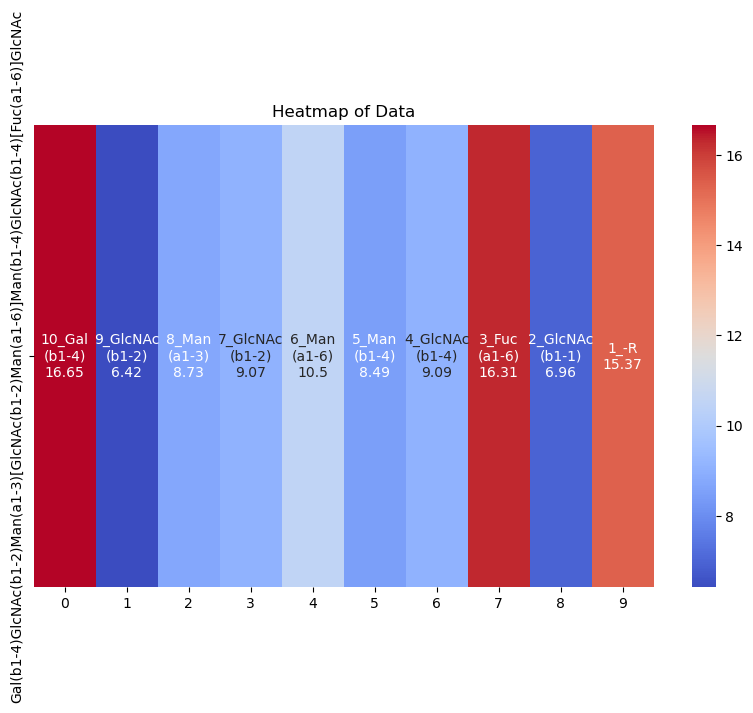

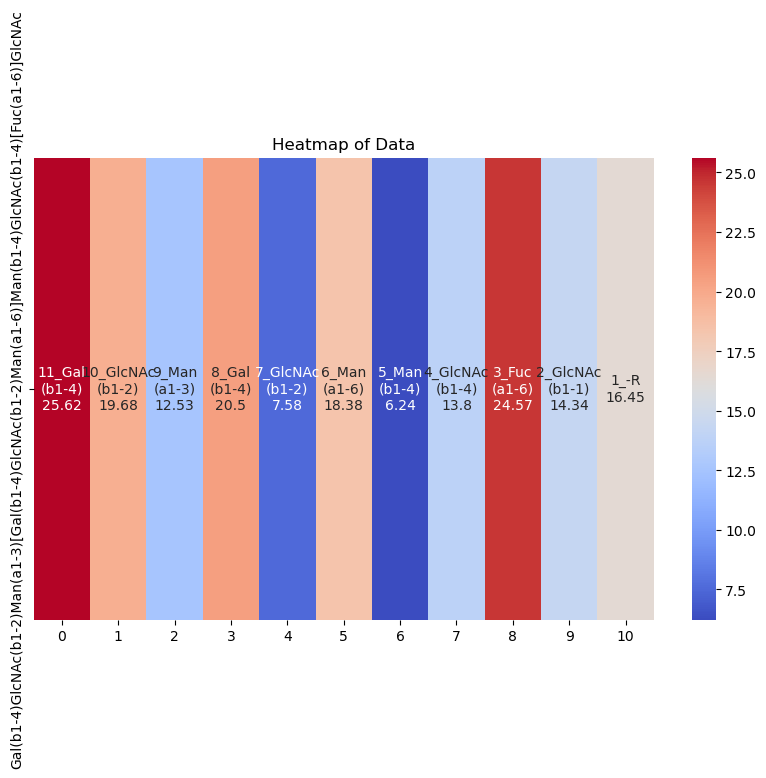

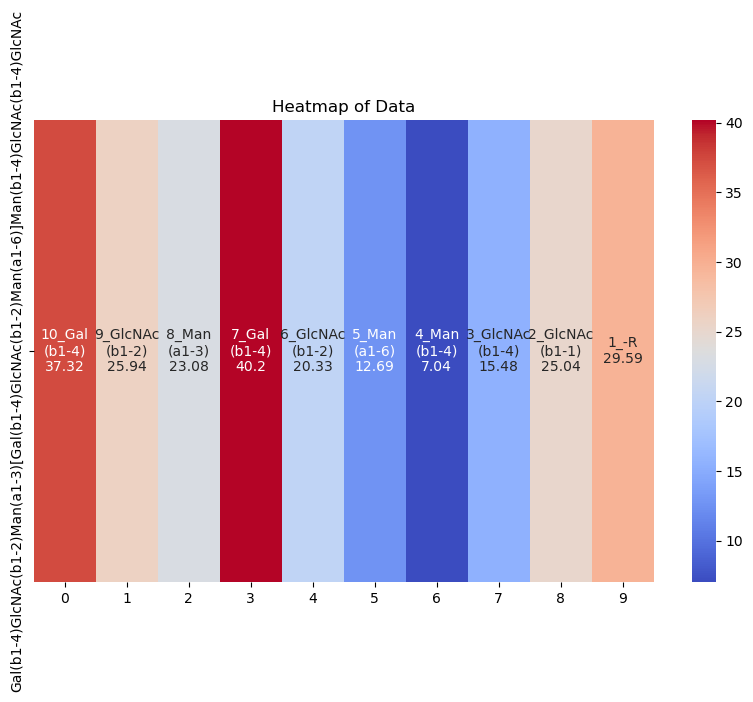

In [234]:
for g in nglycan_path :
    list_of_res = []
    list_of_mono = []
    dict_res = {}
    valid_list = []
    my_glycans_path = "glycans_pdb/"
    try :
        currlist = []
        isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted' )
        res = overall_monosaccharide_flexibility(isvt, mode='mean')
        val_list = [res[key] for key in res]
        mono_list = [key.replace('(','\n(') + '\n' + str(round(res[key],ndigits= 2)) for key in res]
        list_of_res.append(val_list)
        dict_res[g] = res
        list_of_mono.append(mono_list)
        valid_list.append(g)


        data_inverted = [row[::-1] for row in list_of_res]
        annotations_inverted = [row[::-1] for row in list_of_mono]  # Reverses each row (i.e., the columns)


        plt.figure(figsize=(10, 6))  # Adjust size if needed
        sns.heatmap(data_inverted, annot=annotations_inverted, fmt="", cmap="coolwarm", yticklabels=valid_list)
        # Adjust the font size of the column and row labels

        # Rotate column labels if necessary

        # Show the heatmap
        plt.title('Heatmap of Data')
        plt.savefig(str(g) + '_heatmap_flexibility.png', dpi=300, bbox_inches='tight')

    except: 
        print("This glycan failed: " + g)
    

# 5 Flexibility and accessibility of sialylated glycans

In [6]:
neu_glycan_list = ['Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Neu5Gc(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                   'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Man(a1-3)[Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                   'Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Man(a1-6)[Man(a1-3)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc']

neu_glycan_list = ['Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)[GlcNAc(b1-2)Man(a1-3)][GlcNAc(b1-4)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)][GlcNAc(b1-4)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'GlcNAc(b1-4)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)][GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-3)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc',
                'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc',
                'Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-6)]GlcNAc(b1-2)Gal(b1-4)[Fuc(a1-6)]GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc']

-R : 0.4368003499969839
GlcNAc(b1-1) : 2.4753557585279107
GlcNAc(b1-4) : 1.843912332497933
Man(b1-4) : 0.5657684119484271
Man(a1-6) : 1.508635520054592
GlcNAc(b1-2) : 1.66470314643858
Gal(b1-4) : 1.365343466358626
Neu5Ac(a2-3) : 3.5384757147622237
GlcNAc(b1-4) : 2.273387200085888
Man(a1-3) : 1.146977070371434
GlcNAc(b1-2) : 2.6740499989517614
-R : 0.4318060851499439
GlcNAc(b1-1) : 2.83305623299887
GlcNAc(b1-4) : 1.9185839239248195
Man(b1-4) : 0.685386085636326
Man(a1-3) : 1.6535155319750425
GlcNAc(b1-2) : 2.6544187951493545
GlcNAc(b1-4) : 2.0831256010429002
Man(a1-6) : 1.4454360693287336
GlcNAc(b1-2) : 1.8382045088857646
Gal(b1-4) : 1.6235997602541816
Neu5Ac(a2-6) : 3.9828162315000024
-R : 0.4438227208757629
GlcNAc(b1-1) : 2.7558312825450226
GlcNAc(b1-4) : 2.0176017285544536
Man(b1-4) : 0.5892175502267771
Man(a1-6) : 1.4244209050640224
GlcNAc(b1-2) : 2.692548333033396
GlcNAc(b1-4) : 1.8417797421340225
Man(a1-3) : 1.668961903722101
GlcNAc(b1-2) : 2.029696964486188
Gal(b1-4) : 1.43792852

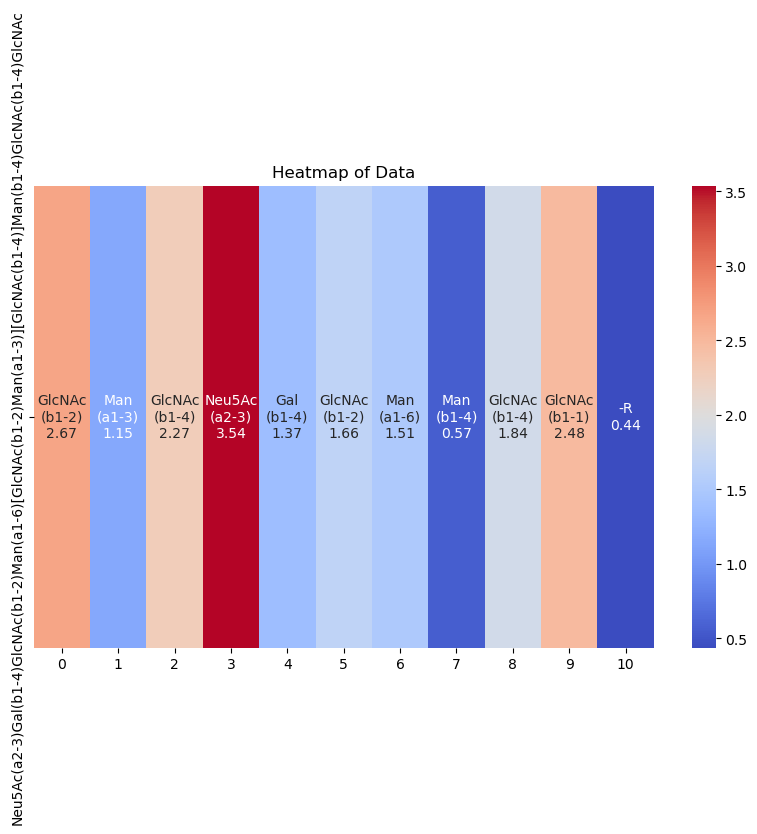

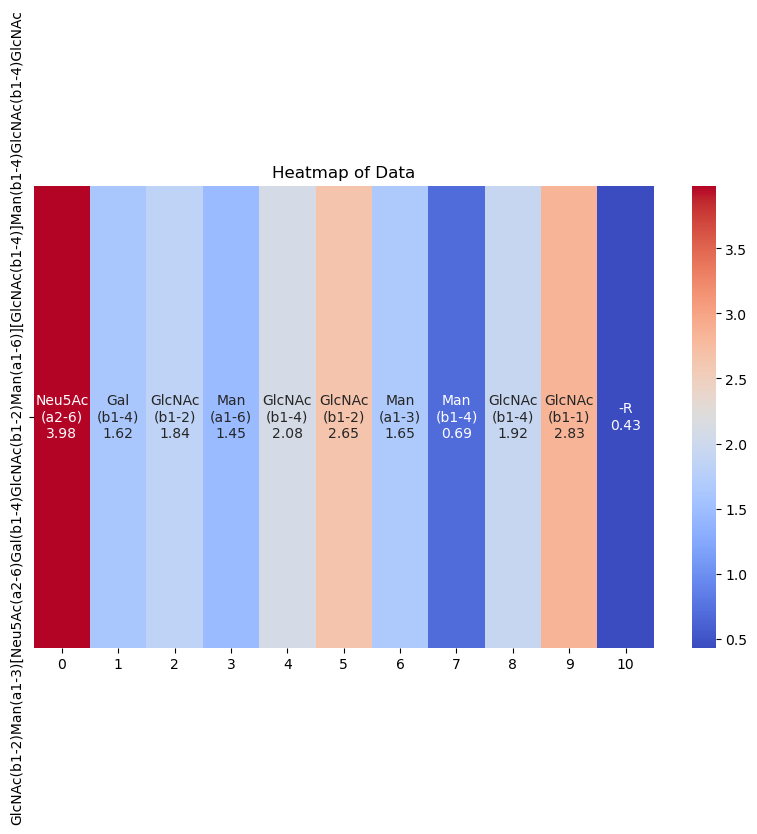

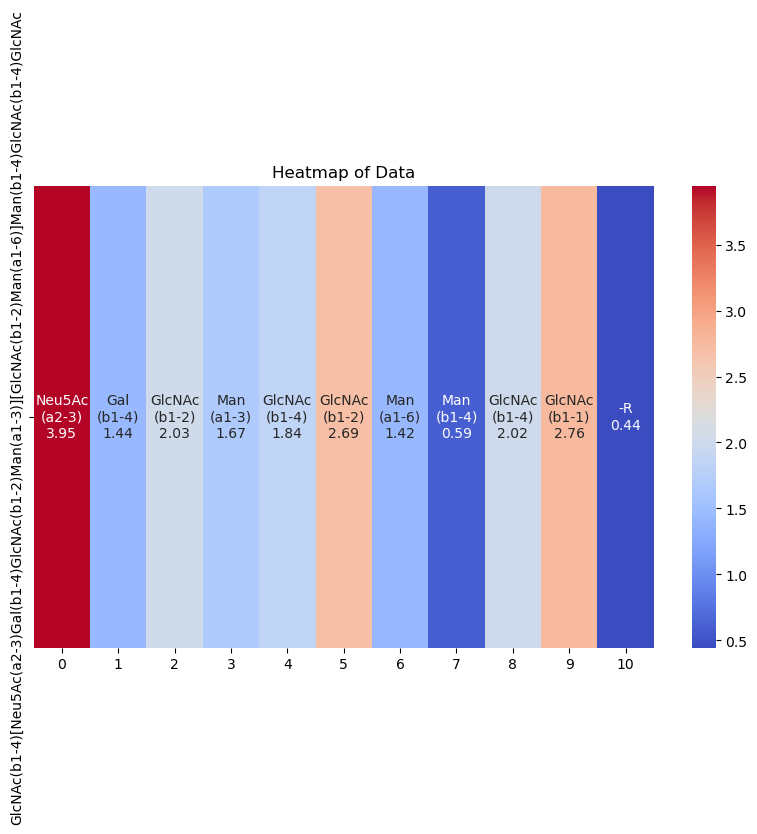

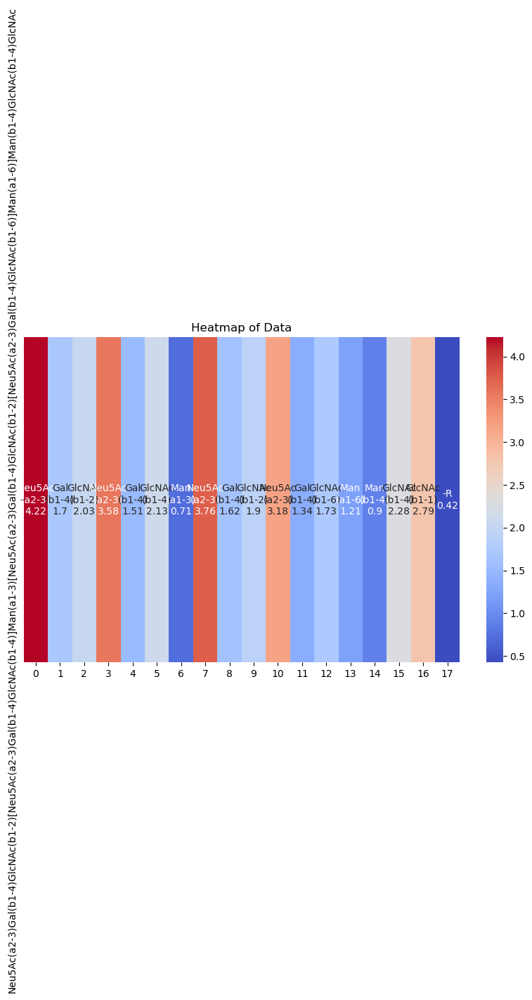

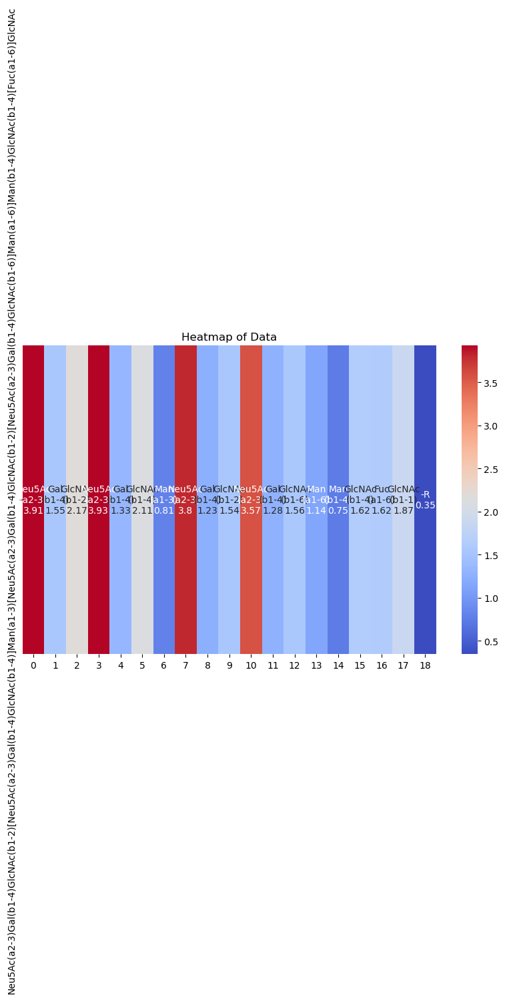

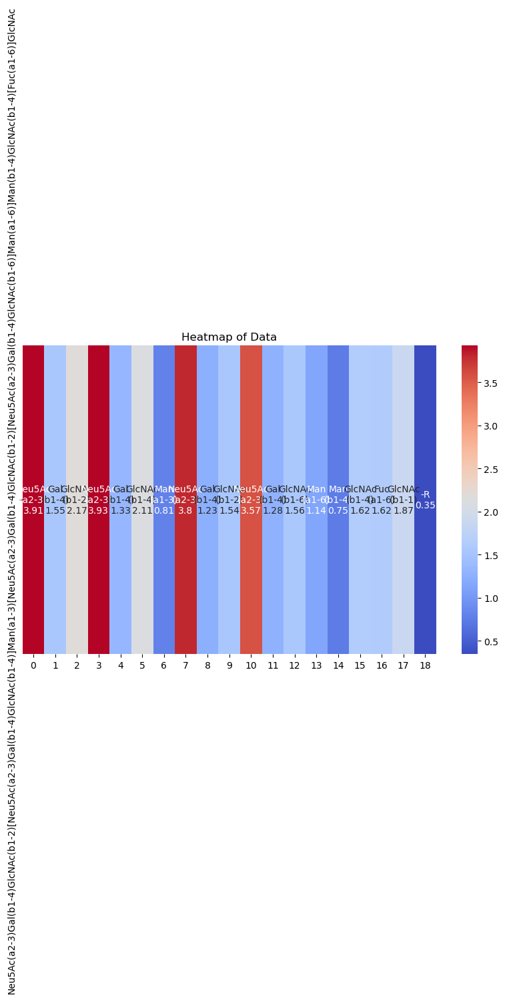

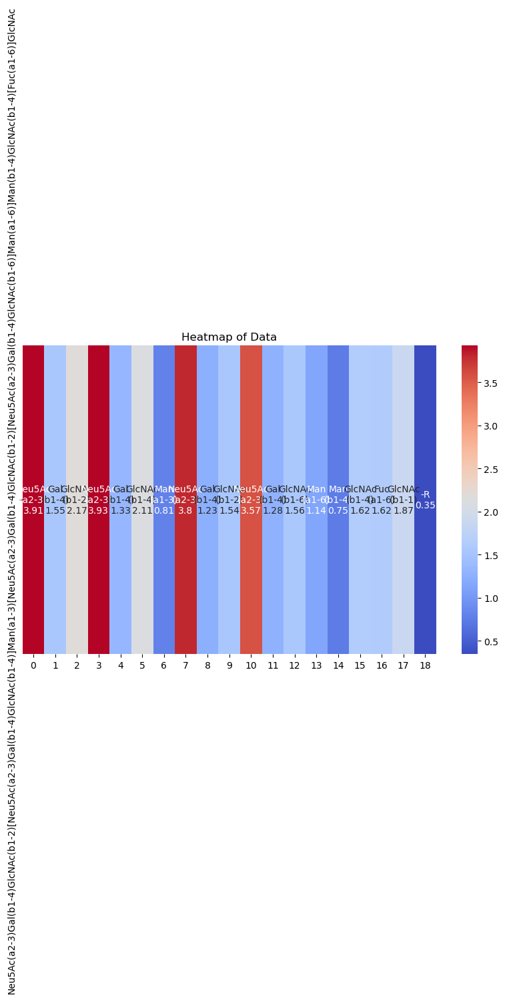

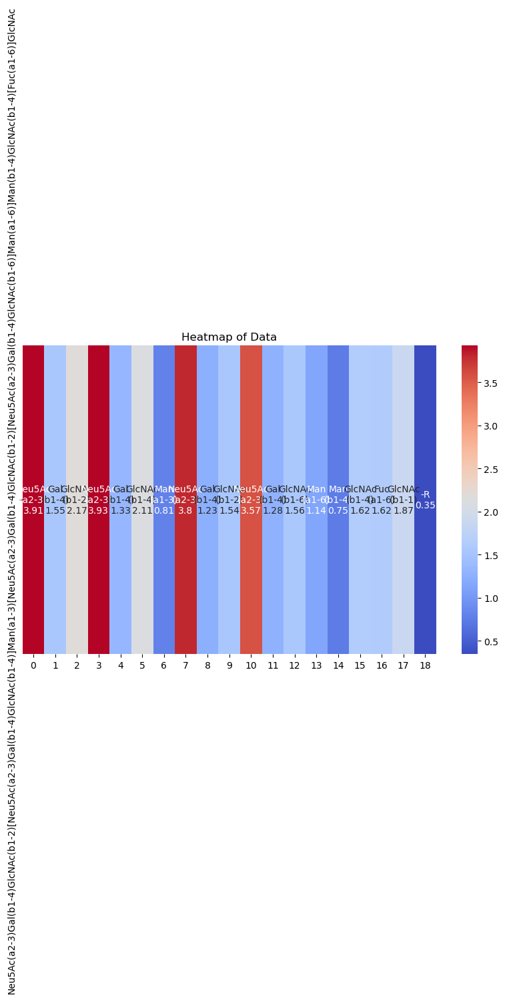

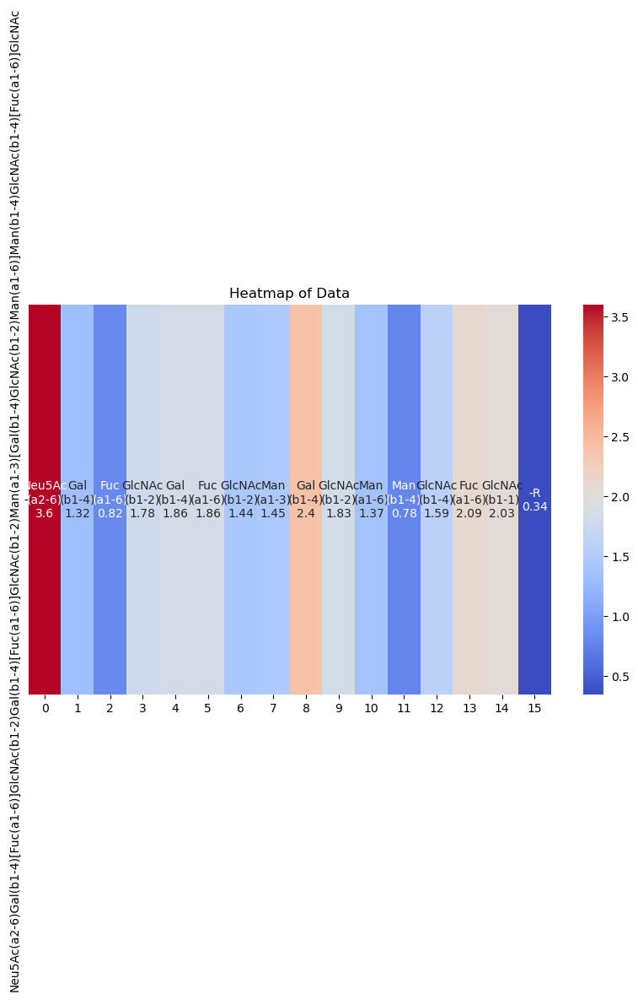

In [7]:
for g in neu_glycan_list :
    list_of_res = []
    list_of_mono = []
    dict_res = {}
    valid_list = []
    my_glycans_path = "glycans_pdb/"
    try :
        currlist = []
        resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
        res = [v for v in resdf['Weighted Score'].to_list()]
        monolist = [v for v in resdf['Monosaccharide'].to_list()]
        list_of_res.append(res)
        dict_res[g] = res
        
        for x in range(0,len(res)):
            currlist.append(monolist[x].replace('(','\n(') + '\n' + str(round(res[x],ndigits= 2)))
            print(monolist[x] + ' : ' + str(res[x]))
        list_of_mono.append(currlist)
        valid_list.append(g)
        data_inverted = [row[::-1] for row in list_of_res]
        annotations_inverted = [row[::-1] for row in list_of_mono]  # Reverses each row (i.e., the columns)

        plt.figure(figsize=(10, 6))  # Adjust size if needed
        sns.heatmap(data_inverted, annot=annotations_inverted, fmt="", cmap="coolwarm", yticklabels=valid_list)
        # Adjust the font size of the column and row labels

        # Rotate column labels if necessary

        # Show the heatmap
        plt.title('Heatmap of Data')
        plt.savefig(str(g) + '_heatmap_SASA_NEU.png', dpi=300, bbox_inches='tight')

    except: 
        print("This glycan failed: " + g)
    

This glycan failed: Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-3)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc
This glycan failed: Neu5Ac(a2-

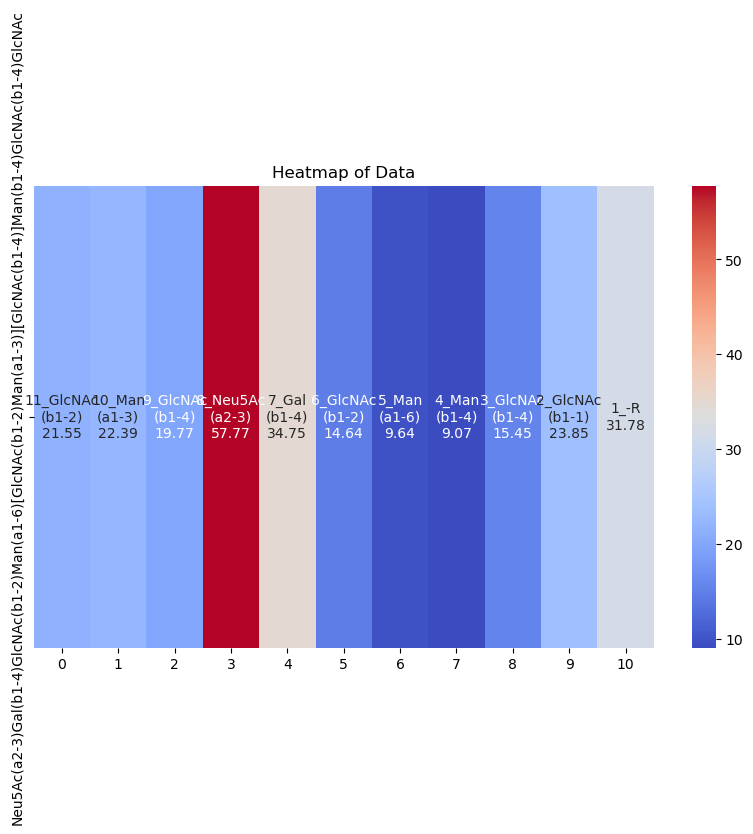

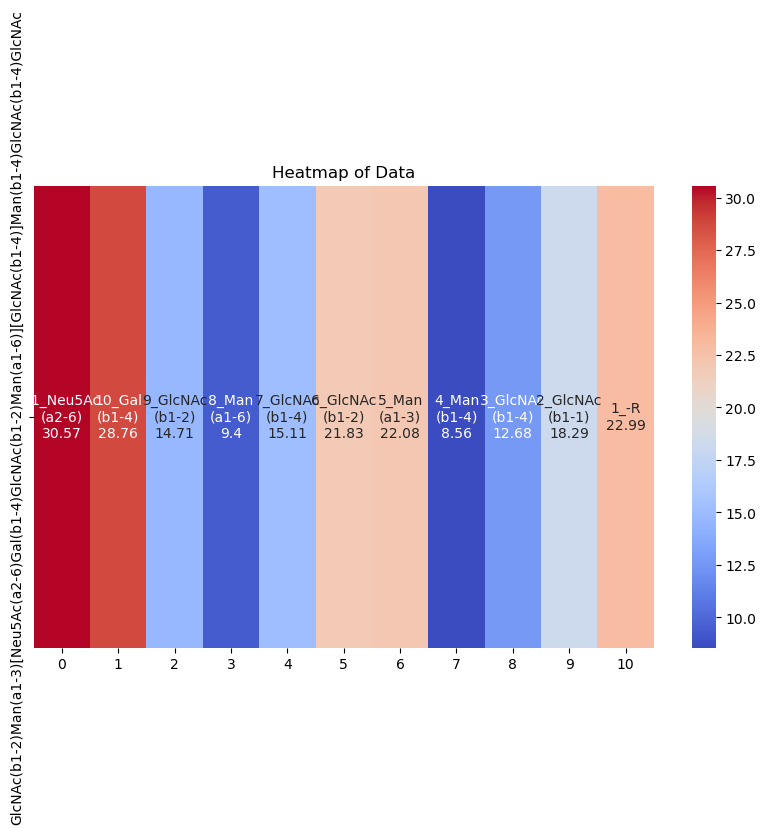

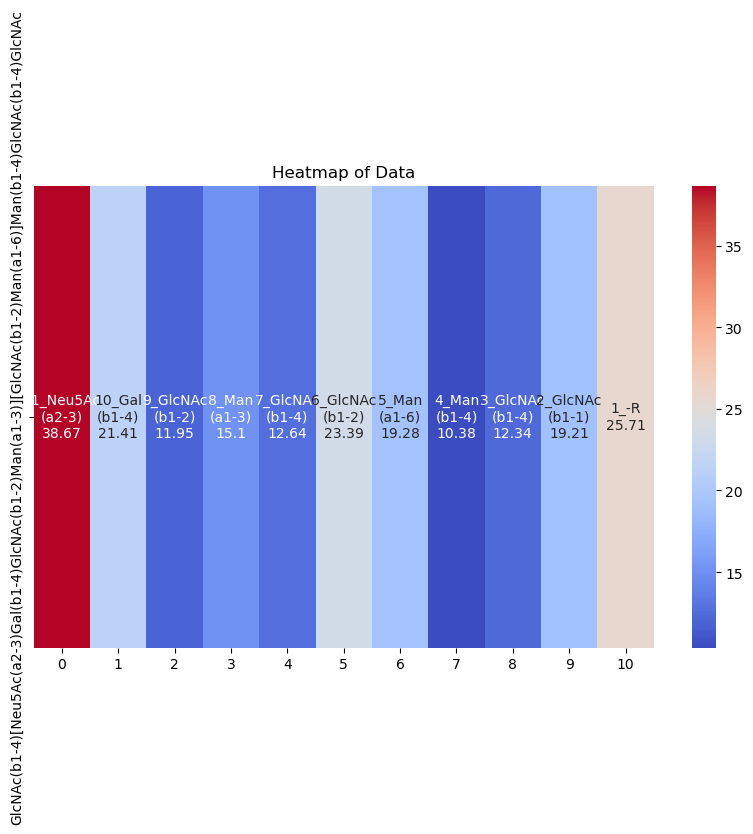

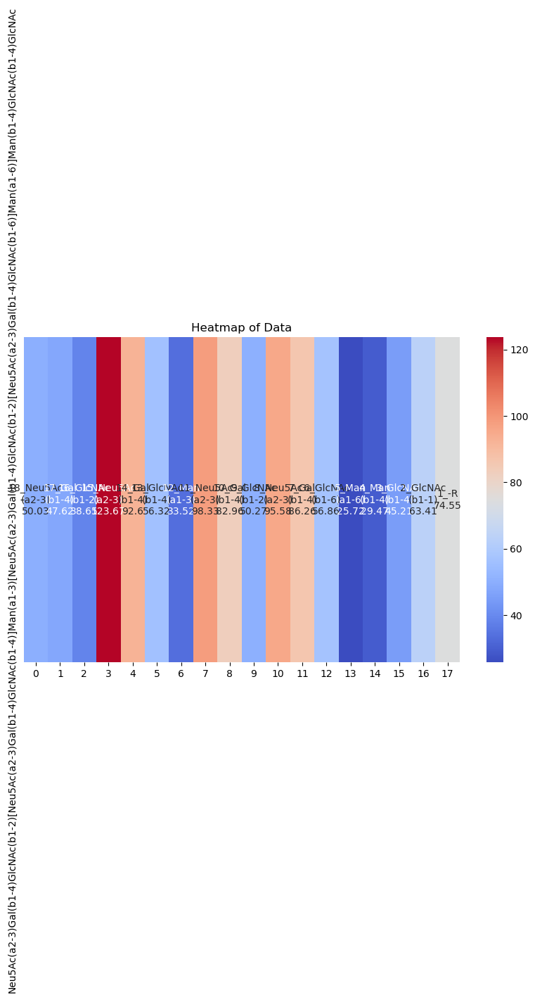

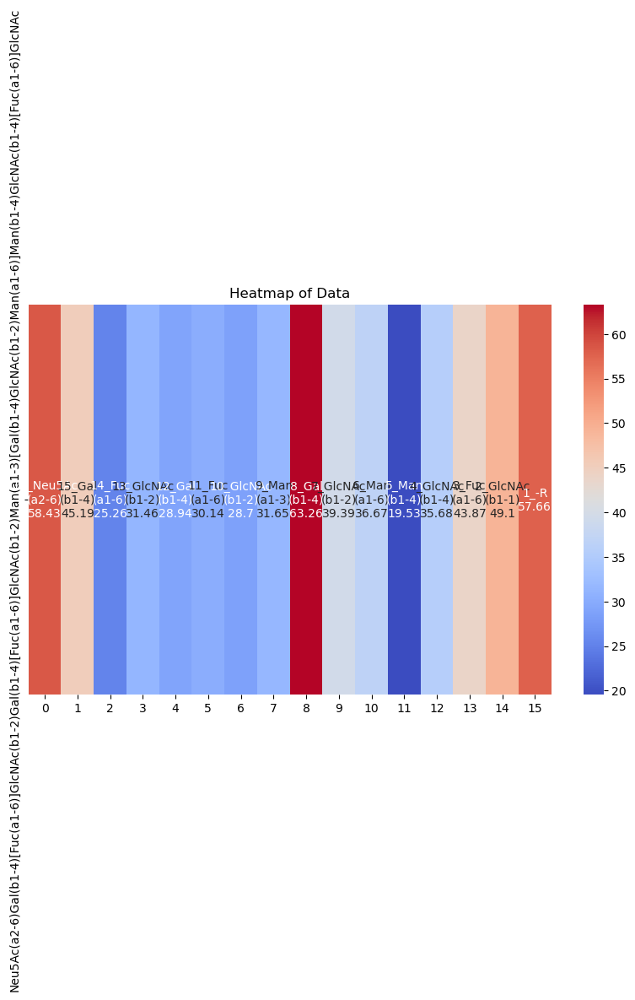

In [8]:
for g in neu_glycan_list :
    list_of_res = []
    list_of_mono = []
    dict_res = {}
    valid_list = []
    my_glycans_path = "glycans_pdb/"
    try :
        currlist = []
        isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted' )
        res = overall_monosaccharide_flexibility(isvt, mode='mean')
        val_list = [res[key] for key in res]
        mono_list = [key.replace('(','\n(') + '\n' + str(round(res[key],ndigits= 2)) for key in res]
        list_of_res.append(val_list)
        dict_res[g] = res
        list_of_mono.append(mono_list)
        valid_list.append(g)


        data_inverted = [row[::-1] for row in list_of_res]
        annotations_inverted = [row[::-1] for row in list_of_mono]  # Reverses each row (i.e., the columns)


        plt.figure(figsize=(10, 6))  # Adjust size if needed
        sns.heatmap(data_inverted, annot=annotations_inverted, fmt="", cmap="coolwarm", yticklabels=valid_list)
        # Adjust the font size of the column and row labels

        # Rotate column labels if necessary

        # Show the heatmap
        plt.title('Heatmap of Data')
        plt.savefig(str(g) + '_heatmap_flexibility_NEU.png', dpi=300, bbox_inches='tight')

    except: 
        print("This glycan failed: " + g)